In [ ]:
!pip install open3d wandb tqdm huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 39.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [ ]:
import os
import glob
import zipfile
import random

import numpy as np
import open3d as o3d

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

import wandb

from huggingface_hub import hf_hub_download

In [ ]:
CFG = {

    "data_dir": "data/MaizeField",

    "num_points": 1024,
    "batch_size": 8,

    "epochs": 1000,
    "lr": 1e-4,

    "latent_dim": 256,
    "k": 16,

    "subset_size": 500,

    "checkpoint_interval": 25
}

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
os.makedirs("data", exist_ok=True)

print("📥 Downloading raw point clouds (10k points per plant)...")

zip_path = hf_hub_download(
    repo_id="BGLab/MaizeField3D",
    filename="datasets/FielGrwon_ZeaMays_RawPCD_10k.zip",
    repo_type="dataset",
    local_dir="data"
)

print("📦 Extracting...")

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(CFG["data_dir"])

ply_files = sorted(glob.glob(f"{CFG['data_dir']}/**/*.ply", recursive=True))

print(f"✅ Found {len(ply_files)} plant files.")

📥 Downloading raw point clouds (10k points per plant)...
📦 Extracting...
✅ Found 1045 plant files.


In [ ]:
random.shuffle(ply_files)

ply_files = ply_files[:CFG["subset_size"]]

print("Training plants:", len(ply_files))

Training plants: 500


In [ ]:
def normalize_pc(pc):

    pc = pc - pc.mean(axis=0)

    scale = np.sqrt((pc**2).sum(axis=1)).max()

    pc = pc / scale

    return pc


def sample_points(pc, n):

    if pc.shape[0] >= n:

        idx = np.random.choice(pc.shape[0], n, replace=False)

    else:

        idx = np.random.choice(pc.shape[0], n, replace=True)

    return pc[idx]

In [ ]:
class MaizeDataset(Dataset):

    def __init__(self, files):

        self.files = files


    def __len__(self):

        return len(self.files)


    def __getitem__(self, idx):

        pcd = o3d.io.read_point_cloud(self.files[idx])

        points = np.asarray(pcd.points)

        points = normalize_pc(points)

        points = sample_points(points, CFG["num_points"])

        return torch.tensor(points, dtype=torch.float32)

In [ ]:
dataset = MaizeDataset(ply_files)

loader = DataLoader(
    dataset,
    batch_size=CFG["batch_size"],
    shuffle=True,
    num_workers=2
)

In [ ]:
wandb.login()

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: shantanugupta2004 (shantanugupta2004-own-use) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
wandb.init(
    project="maizefield-dgcnn-ae-log",
    config=CFG
)

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇████
final_test_loss,▁
final_val_loss,▁
loss,█▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,499
final_test_loss,0.00336
final_val_loss,0.00328
loss,0.0007


In [ ]:
def knn(x, k):

    inner = -2 * torch.matmul(x.transpose(2,1), x)
    xx = torch.sum(x**2, dim=1, keepdim=True)

    pairwise_distance = -xx - inner - xx.transpose(2,1)

    idx = pairwise_distance.topk(k=k, dim=-1)[1]

    return idx

In [ ]:
def get_graph_feature(x, k=20):

    batch_size = x.size(0)
    num_points = x.size(2)

    idx = knn(x, k)

    device = x.device

    idx_base = torch.arange(0, batch_size, device=device).view(-1,1,1)*num_points

    idx = idx + idx_base
    idx = idx.view(-1)

    x = x.transpose(2,1).contiguous()

    feature = x.view(batch_size*num_points, -1)[idx,:]
    feature = feature.view(batch_size, num_points, k, -1)

    x = x.view(batch_size, num_points, 1, -1).repeat(1,1,k,1)

    feature = torch.cat((feature-x, x), dim=3).permute(0,3,1,2)

    return feature

In [ ]:
class DGCNN_Encoder(nn.Module):

    def __init__(self):

        super().__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(6,64,1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(128,128,1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(256,256,1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2)
        )

        self.fc = nn.Linear(256, CFG["latent_dim"])


    def forward(self,x):

        x = x.transpose(2,1)

        x = get_graph_feature(x, CFG["k"])
        x = self.conv1(x)
        x1 = x.max(dim=-1)[0]

        x = get_graph_feature(x1, CFG["k"])
        x = self.conv2(x)
        x2 = x.max(dim=-1)[0]

        x = get_graph_feature(x2, CFG["k"])
        x = self.conv3(x)
        x3 = x.max(dim=-1)[0]

        x = x3.max(dim=-1)[0]

        latent = self.fc(x)

        return latent

In [ ]:
class Decoder(nn.Module):

    def __init__(self):

        super().__init__()

        self.mlp = nn.Sequential(

            nn.Linear(CFG["latent_dim"],512),
            nn.ReLU(),

            nn.Linear(512,1024),
            nn.ReLU(),

            nn.Linear(1024,CFG["num_points"]*3)

        )


    def forward(self,z):

        x = self.mlp(z)

        x = x.view(-1, CFG["num_points"],3)

        return x

In [ ]:
class PointAutoEncoder(nn.Module):

    def __init__(self):

        super().__init__()

        self.encoder = DGCNN_Encoder()
        self.decoder = Decoder()

    def forward(self,x):

        z = self.encoder(x)

        recon = self.decoder(z)

        return recon

In [ ]:
def chamfer_loss(pc1, pc2):

    diff = pc1.unsqueeze(2) - pc2.unsqueeze(1)

    dist = torch.sum(diff**2, dim=-1)

    loss1 = dist.min(dim=2)[0].mean()
    loss2 = dist.min(dim=1)[0].mean()

    return loss1 + loss2

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def visualize_reconstruction(model, dataset, device):

    model.eval()

    idx = np.random.randint(len(dataset))

    pc = dataset[idx].unsqueeze(0).to(device)

    with torch.no_grad():

        recon = model(pc)

    pc = pc.squeeze().cpu().numpy()
    recon = recon.squeeze().cpu().numpy()

    fig = plt.figure(figsize=(12,6))

    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(pc[:,0], pc[:,1], pc[:,2], s=1)
    ax1.set_title("Original")

    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(recon[:,0], recon[:,1], recon[:,2], s=1)
    ax2.set_title("Reconstruction")

    plt.show()

    return fig

In [ ]:
def log_reconstruction(model, dataset, device, epoch):

    fig = visualize_reconstruction(model, dataset, device)

    wandb.log({
        "reconstruction": wandb.Image(fig),
        "epoch": epoch
    })

100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


Epoch 0 Loss 0.016755748732340713


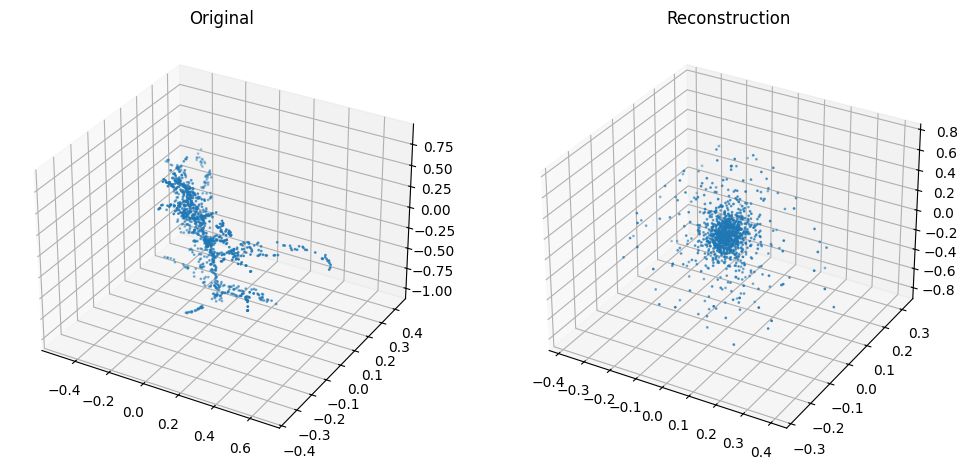

100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 1 Loss 0.012223231414007761


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 2 Loss 0.0107177324326975


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 3 Loss 0.009792945273811854


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 4 Loss 0.00952467132389309


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 5 Loss 0.008937735724011584


100%|██████████| 63/63 [00:05<00:00, 12.13it/s]


Epoch 6 Loss 0.008583527006622817


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 7 Loss 0.008028927414367596


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 8 Loss 0.007790114612333358


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 9 Loss 0.007474223307023446


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 10 Loss 0.007415158607597862


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 11 Loss 0.007121736006367774


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


Epoch 12 Loss 0.006881941124678604


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


Epoch 13 Loss 0.006677000221633722


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 14 Loss 0.006439564232197072


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


Epoch 15 Loss 0.0064381481857881655


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


Epoch 16 Loss 0.006208895639117275


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 17 Loss 0.005968221138039279


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


Epoch 18 Loss 0.005910008916601775


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


Epoch 19 Loss 0.005791630640271164


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 20 Loss 0.005676211057496923


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


Epoch 21 Loss 0.005539435346329969


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 22 Loss 0.005454985070086661


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 23 Loss 0.005317395589950066


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 24 Loss 0.005221350650702204


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 25 Loss 0.005217215467599176


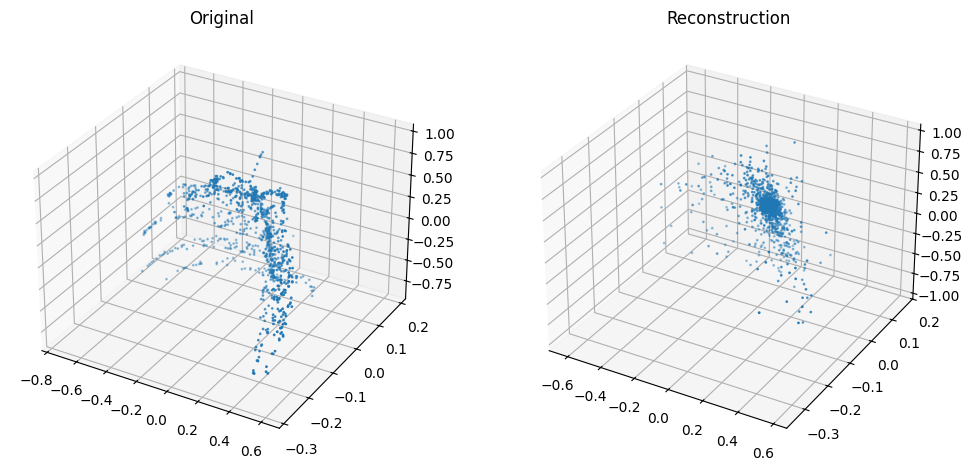

100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 26 Loss 0.00510470788659794


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 27 Loss 0.005028154316639144


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 28 Loss 0.0049472830982671846


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 29 Loss 0.004796349436103824


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


Epoch 30 Loss 0.0047345646538786475


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 31 Loss 0.004682410016862882


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 32 Loss 0.004658126057909121


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


Epoch 33 Loss 0.004692812856759817


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 34 Loss 0.004535072852694799


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 35 Loss 0.004415048071966758


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


Epoch 36 Loss 0.004385461151185963


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 37 Loss 0.004383678729128506


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 38 Loss 0.004239196722794857


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


Epoch 39 Loss 0.0041214448606802356


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 40 Loss 0.004057844675752142


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 41 Loss 0.004067311355371087


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


Epoch 42 Loss 0.003962020245602443


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 43 Loss 0.003914070651969976


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 44 Loss 0.003885429393174866


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 45 Loss 0.003872296480935008


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 46 Loss 0.003770815774000117


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 47 Loss 0.0036731455770749894


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 48 Loss 0.0037469826675655825


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 49 Loss 0.0035934943875800523


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 50 Loss 0.0036419540133682034


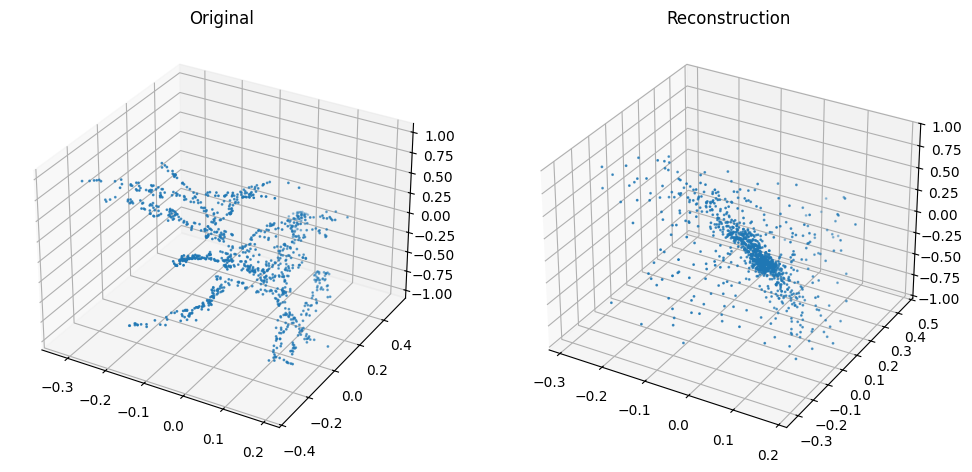

100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


Epoch 51 Loss 0.0035233791984085527


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 52 Loss 0.003534056445849793


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 53 Loss 0.0034923647670814443


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 54 Loss 0.0034290452835164845


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 55 Loss 0.0034403000876957936


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 56 Loss 0.0033423088394874145


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 57 Loss 0.0033245765500598485


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 58 Loss 0.0033302136571220463


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 59 Loss 0.0032027942934147423


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 60 Loss 0.0031990100710933642


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 61 Loss 0.00318953473239191


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 62 Loss 0.003177108135931785


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 63 Loss 0.00311662645877472


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 64 Loss 0.003086051733661739


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 65 Loss 0.003055269124045495


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


Epoch 66 Loss 0.003005052488001566


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 67 Loss 0.0029811103650856587


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 68 Loss 0.0028911258153144328


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 69 Loss 0.002872757754096436


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 70 Loss 0.0028782569884603457


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 71 Loss 0.002874825582174318


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 72 Loss 0.0028273139466782884


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 73 Loss 0.0027952401617926267


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 74 Loss 0.0027328620790430004


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


Epoch 75 Loss 0.002708831121997228


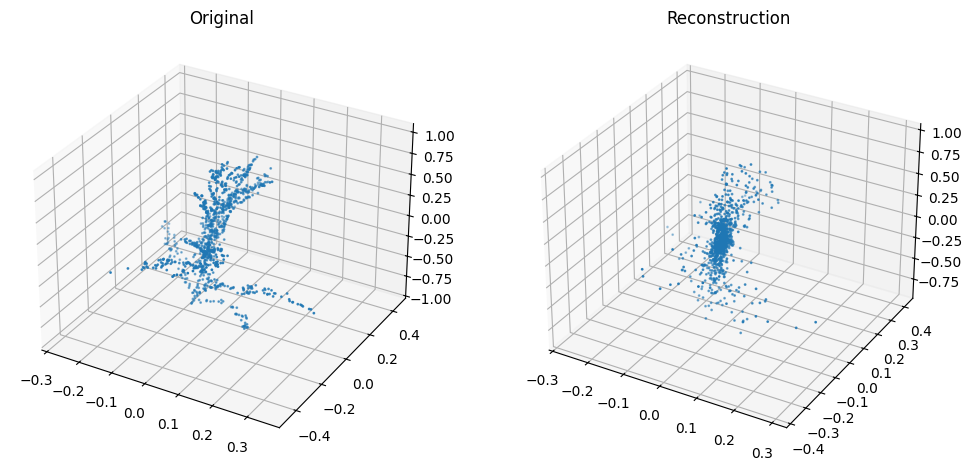

100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 76 Loss 0.0027301095699566224


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 77 Loss 0.0026749746674405678


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


Epoch 78 Loss 0.0027044332394051173


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 79 Loss 0.002662135251162071


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 80 Loss 0.002620071985773624


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 81 Loss 0.002620800073066401


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 82 Loss 0.002567324624766433


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 83 Loss 0.0025481607484084275


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 84 Loss 0.0025259968122496963


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 85 Loss 0.0025161333559524444


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 86 Loss 0.0024775114383489365


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


Epoch 87 Loss 0.0024875151473910564


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 88 Loss 0.002448849490888062


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 89 Loss 0.0024643084329981652


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 90 Loss 0.0024108705147805197


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 91 Loss 0.002349756077848493


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 92 Loss 0.0023516369244408987


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


Epoch 93 Loss 0.002381005328119038


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 94 Loss 0.0023429517538124133


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 95 Loss 0.002311101807872691


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 96 Loss 0.0022843778724708254


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 97 Loss 0.0022579358487818686


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 98 Loss 0.002238579927795818


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 99 Loss 0.002182515175451362


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 100 Loss 0.0022206409919326977


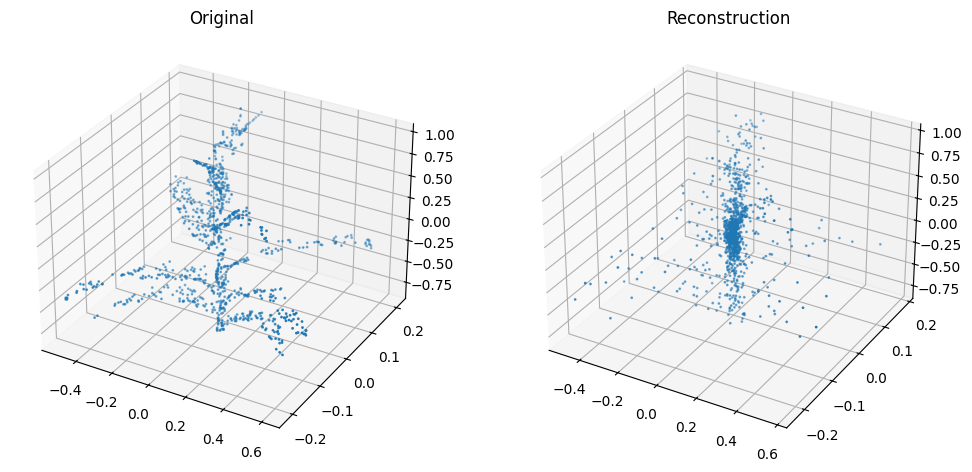

100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 101 Loss 0.0022707040724714122


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 102 Loss 0.0021831865536995113


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 103 Loss 0.002163800359186199


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 104 Loss 0.0021841852641147044


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 105 Loss 0.002122294163287041


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 106 Loss 0.002067972168636819


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 107 Loss 0.002137273319050788


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 108 Loss 0.002178497409211501


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 109 Loss 0.0020822501271992684


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 110 Loss 0.0020539110641009987


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 111 Loss 0.0020277619284267225


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 112 Loss 0.0020394759448540824


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 113 Loss 0.0020209395858858314


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 114 Loss 0.0019780120771703503


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 115 Loss 0.0019840892452362272


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 116 Loss 0.001975367839876858


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 117 Loss 0.001959239092049381


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 118 Loss 0.0019224610342274582


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 119 Loss 0.0019483155818537823


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 120 Loss 0.001931678322661254


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 121 Loss 0.0019084122881943744


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 122 Loss 0.0019088500393702396


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 123 Loss 0.001879386869924409


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 124 Loss 0.0019003385345318488


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 125 Loss 0.0018528016868032634


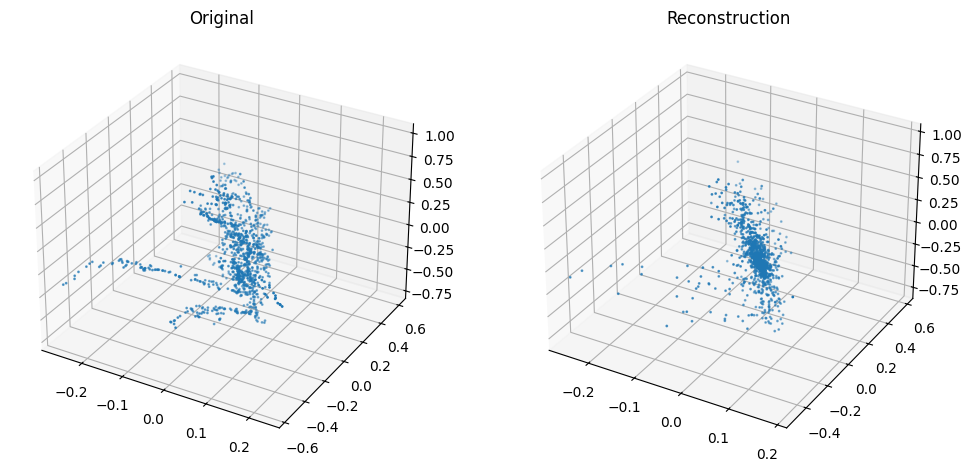

100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 126 Loss 0.0018343615404788464


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 127 Loss 0.0018582245989126108


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 128 Loss 0.0018393595237284899


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 129 Loss 0.001826623456537842


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 130 Loss 0.0018269462669859566


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 131 Loss 0.001745895266399852


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 132 Loss 0.0017563781446023356


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 133 Loss 0.0017552564109099052


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 134 Loss 0.0017676436941006354


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 135 Loss 0.0017323616286000563


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 136 Loss 0.0017893633524340296


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 137 Loss 0.001711767137287155


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


Epoch 138 Loss 0.0017081210629955408


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 139 Loss 0.0017362207909750323


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 140 Loss 0.0017492697566806796


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 141 Loss 0.001694518642219168


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 142 Loss 0.0017034460565016148


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 143 Loss 0.001657608619314574


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


Epoch 144 Loss 0.0016437670629885462


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 145 Loss 0.001645439243431957


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 146 Loss 0.0016534302923237047


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


Epoch 147 Loss 0.0016449647197972924


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 148 Loss 0.0016074841065953176


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 149 Loss 0.001600339143936123


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


Epoch 150 Loss 0.0015910079569688865


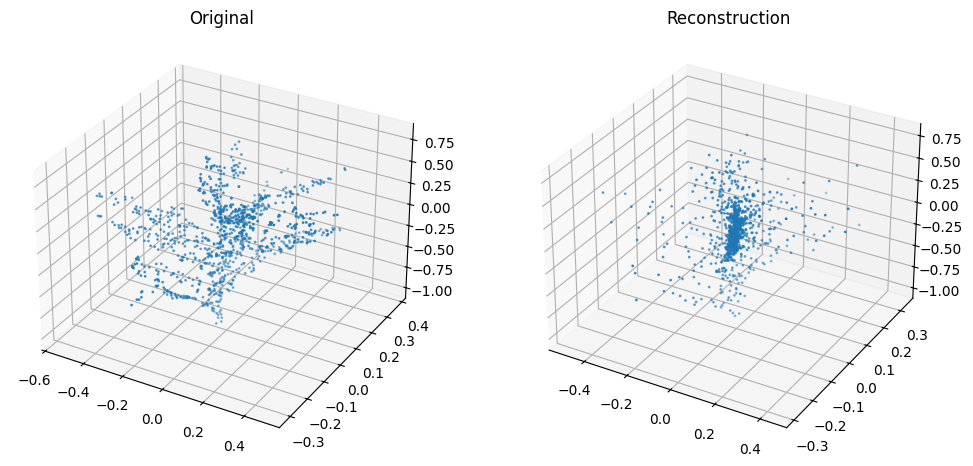

100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 151 Loss 0.0016038464197504615


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 152 Loss 0.0015843901727792052


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


Epoch 153 Loss 0.001557581392782075


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 154 Loss 0.001552678563351196


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 155 Loss 0.0015077548275243431


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 156 Loss 0.001558594372389572


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 157 Loss 0.0015218731732891194


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 158 Loss 0.0015492128293281273


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


Epoch 159 Loss 0.0015166346944632037


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 160 Loss 0.0014758727047592402


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 161 Loss 0.0014799652872459284


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 162 Loss 0.0014883045694746432


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 163 Loss 0.0014999586412505735


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 164 Loss 0.001474948542650848


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 165 Loss 0.0014855277831740087


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 166 Loss 0.0015069592507585647


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 167 Loss 0.0015181148506050546


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


Epoch 168 Loss 0.0015216579010325765


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 169 Loss 0.0014855922828058874


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 170 Loss 0.0014256114761034648


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 171 Loss 0.0014417348337167548


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 172 Loss 0.0014224593095215304


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 173 Loss 0.001421398546044079


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 174 Loss 0.0014132684104085442


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 175 Loss 0.001430382878179588


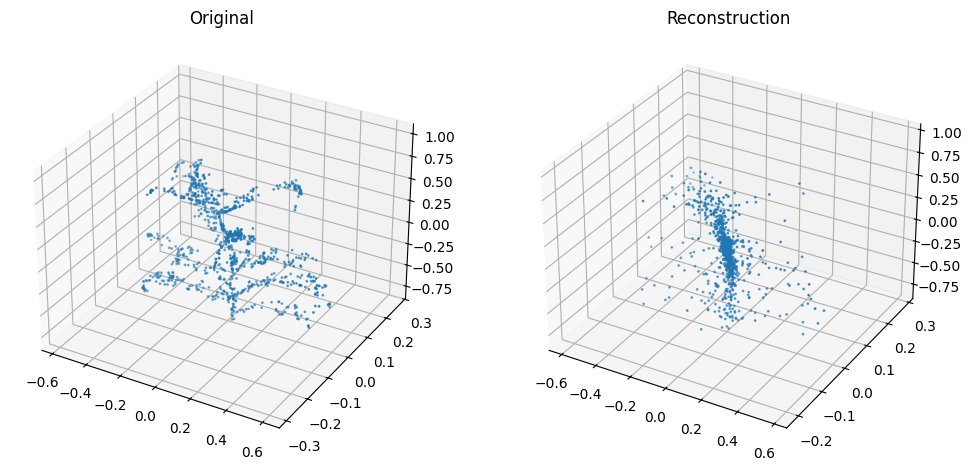

100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 176 Loss 0.0013886240351619937


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 177 Loss 0.001399975743085619


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 178 Loss 0.0013935885517784054


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 179 Loss 0.0013965374756870525


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


Epoch 180 Loss 0.0013614288246673015


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 181 Loss 0.0013921026321541932


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 182 Loss 0.0013832954157676017


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 183 Loss 0.0013942992691660212


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 184 Loss 0.0013537420133601815


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 185 Loss 0.0013277751711448507


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 186 Loss 0.001321552809150446


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 187 Loss 0.0013064344372925541


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 188 Loss 0.0013207093357951159


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 189 Loss 0.0013036738826139342


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 190 Loss 0.0013457075193790452


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 191 Loss 0.0013116247959375855


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 192 Loss 0.0012878776575985646


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 193 Loss 0.00130986912538194


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 194 Loss 0.0012905214384700808


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 195 Loss 0.0012929063707974458


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 196 Loss 0.0012795367344681705


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 197 Loss 0.0012691957591515449


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 198 Loss 0.0012317246587444392


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 199 Loss 0.0012485363154805132


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 200 Loss 0.0012923350783124092


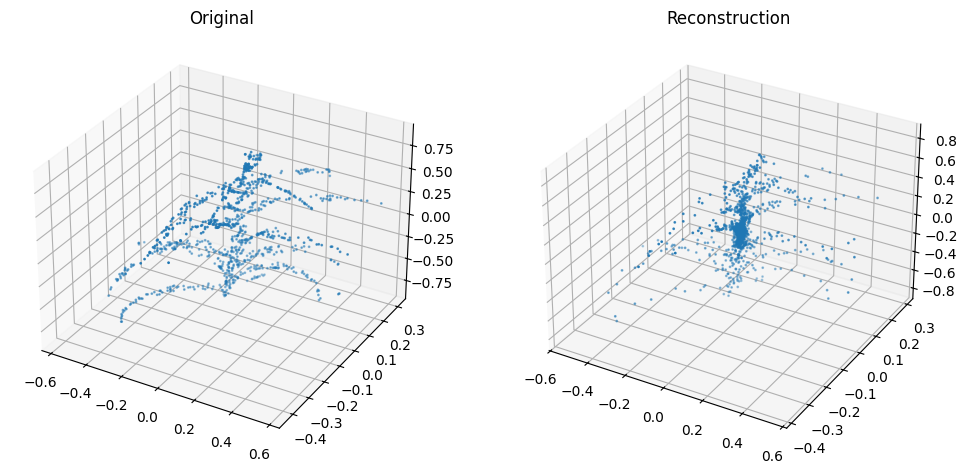

100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


Epoch 201 Loss 0.0012854956042405868


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 202 Loss 0.0012657232120603559


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 203 Loss 0.0012650703900449333


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 204 Loss 0.001267997714291726


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 205 Loss 0.001232501590580103


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 206 Loss 0.0012489562292420675


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 207 Loss 0.001253255593058254


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 208 Loss 0.0012355900354801663


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 209 Loss 0.0011949589206201453


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 210 Loss 0.0012049109708251698


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 211 Loss 0.001179979417458295


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 212 Loss 0.0012110630881839565


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 213 Loss 0.0011762039281339163


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 214 Loss 0.0012111428197443721


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 215 Loss 0.0011810680873514641


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 216 Loss 0.0011687451300935613


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 217 Loss 0.0011939960457975902


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 218 Loss 0.0011795643561830123


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 219 Loss 0.0011895486700629432


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 220 Loss 0.0011891542771269405


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 221 Loss 0.0011914512715376323


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 222 Loss 0.0011873178623823656


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 223 Loss 0.0011648472014164169


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 224 Loss 0.0011645575989008186


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 225 Loss 0.0011651860975054286


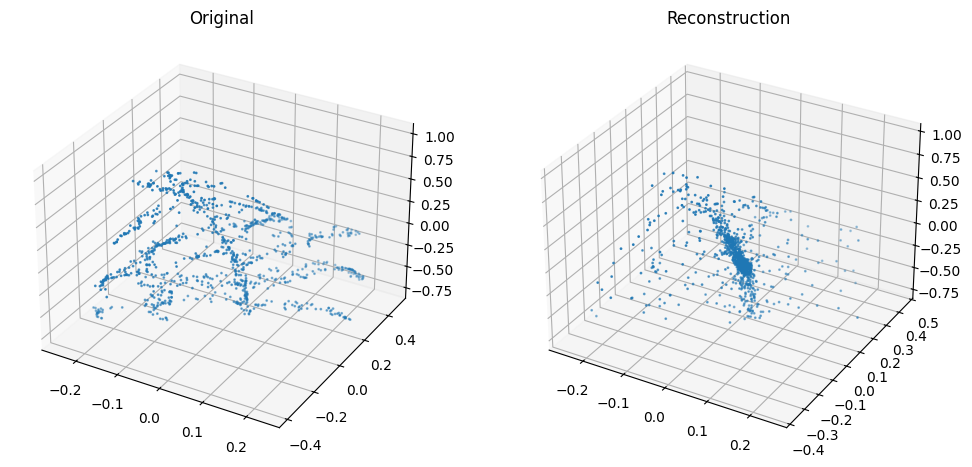

100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 226 Loss 0.0011590682053273277


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 227 Loss 0.001152519844398494


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 228 Loss 0.001142361217976681


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 229 Loss 0.0011392735473309008


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 230 Loss 0.0011483267936412069


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 231 Loss 0.001190186576134274


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 232 Loss 0.0011430239260551475


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 233 Loss 0.0011241011587636812


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 234 Loss 0.0011052269274221054


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 235 Loss 0.0010987455173144265


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 236 Loss 0.001104441597976441


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 237 Loss 0.001115689849636207


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 238 Loss 0.0011332507461442479


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 239 Loss 0.0011077875618837655


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 240 Loss 0.0010961778831505586


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 241 Loss 0.0010833689658385185


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 242 Loss 0.0010724065211852865


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 243 Loss 0.001092522355195667


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 244 Loss 0.0010779907673759948


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 245 Loss 0.0010563325005701729


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 246 Loss 0.0010672225931008894


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 247 Loss 0.0011060563810465355


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 248 Loss 0.0010737126354970748


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 249 Loss 0.0010876311266440012


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 250 Loss 0.0010620601602741296


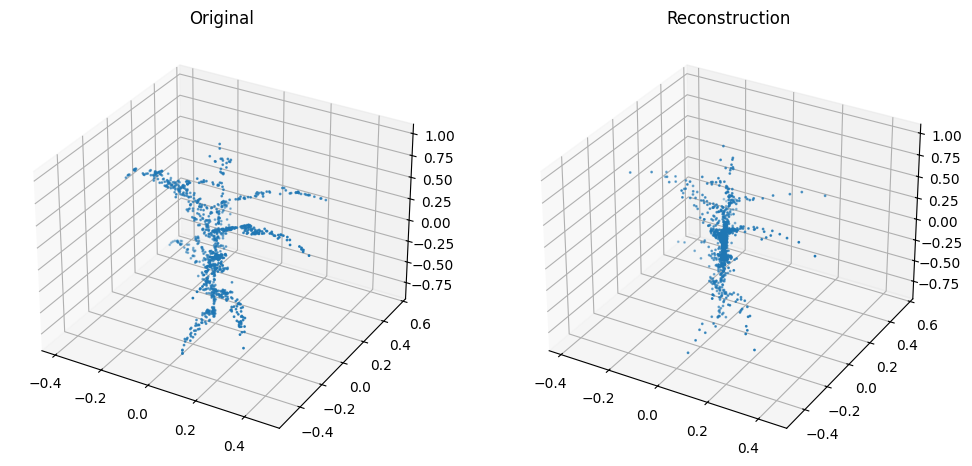

100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


Epoch 251 Loss 0.0010974465403705835


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 252 Loss 0.0010554662892698413


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 253 Loss 0.001078597135982284


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 254 Loss 0.0010428528452942531


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 255 Loss 0.001018807790907366


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 256 Loss 0.0010350737803881721


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 257 Loss 0.0010531965166419035


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 258 Loss 0.0010608483229704675


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 259 Loss 0.0010189395046807707


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 260 Loss 0.0010329017033135252


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 261 Loss 0.0010376091139198886


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 262 Loss 0.001012470137091383


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 263 Loss 0.0010177065860406155


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 264 Loss 0.0010279636055837192


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 265 Loss 0.001033721378050922


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 266 Loss 0.0010278537464771596


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 267 Loss 0.0010306746320104198


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 268 Loss 0.0010365305121041953


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 269 Loss 0.0010162326793688985


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 270 Loss 0.0009998864224476237


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 271 Loss 0.0010029771873387434


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 272 Loss 0.001000024863363554


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 273 Loss 0.0009685401778875126


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 274 Loss 0.0009704837270657576


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 275 Loss 0.0010210902056848957


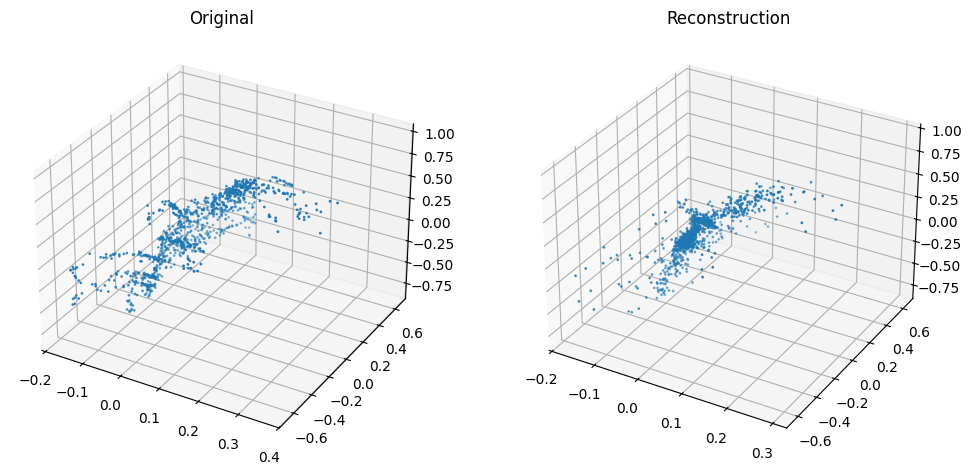

100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 276 Loss 0.001012402421255256


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 277 Loss 0.0009855663427890883


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 278 Loss 0.0009572515522854195


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 279 Loss 0.0009543235267749026


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 280 Loss 0.000982543874886774


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 281 Loss 0.0009780826124673088


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 282 Loss 0.0009766220242627675


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 283 Loss 0.0009534147435000964


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 284 Loss 0.0009637308974070327


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 285 Loss 0.00098797087354349


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 286 Loss 0.0009750305325724185


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 287 Loss 0.0009366807524144413


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 288 Loss 0.0009536972973451373


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 289 Loss 0.0009677378545766549


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 290 Loss 0.0009651145332359842


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 291 Loss 0.0009486778345446856


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 292 Loss 0.0009427468896666099


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 293 Loss 0.000945160258746159


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


Epoch 294 Loss 0.000921245363156592


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 295 Loss 0.0009240260142611252


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 296 Loss 0.0009383205592351419


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 297 Loss 0.0009736636947352617


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 298 Loss 0.0009913301623855082


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 299 Loss 0.0009529596584523836


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 300 Loss 0.0009613313937618856


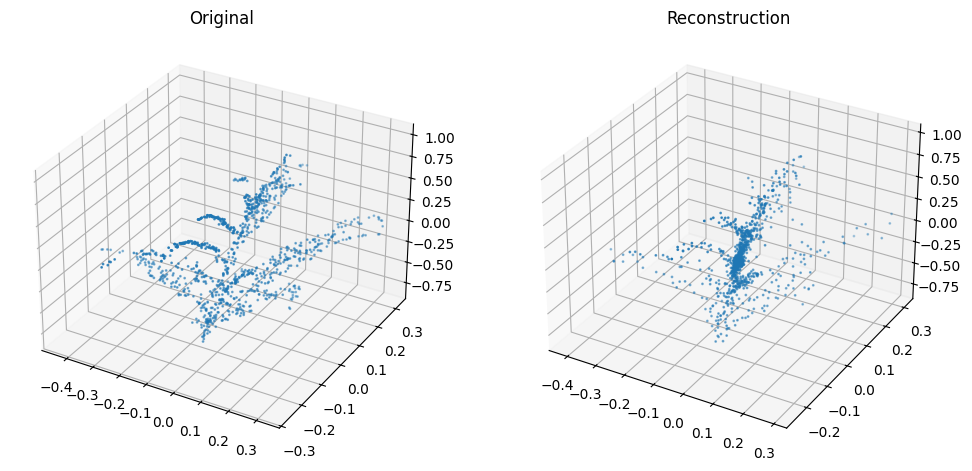

100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 301 Loss 0.0009603983877847592


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 302 Loss 0.0009159102522221113


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 303 Loss 0.000913226345945741


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 304 Loss 0.0009127998944475419


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 305 Loss 0.0009197706729912805


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 306 Loss 0.0009052852309116769


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 307 Loss 0.0009285101827810563


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 308 Loss 0.000931379627362485


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 309 Loss 0.0009226693729278705


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 310 Loss 0.0009456761661798708


100%|██████████| 63/63 [00:05<00:00, 12.07it/s]


Epoch 311 Loss 0.0009268004944296701


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 312 Loss 0.000933270930083439


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 313 Loss 0.0008956027052749599


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 314 Loss 0.0008892123402643299


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 315 Loss 0.000895084664484279


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 316 Loss 0.0009197219661141317


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 317 Loss 0.0009244118922478741


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 318 Loss 0.0009267901861301017


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 319 Loss 0.0009021575392652598


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 320 Loss 0.0009107196949318879


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 321 Loss 0.0009133718614023001


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 322 Loss 0.0009114456996839079


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 323 Loss 0.0009001436539822154


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 324 Loss 0.0008796648434658964


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 325 Loss 0.0008830602922003776


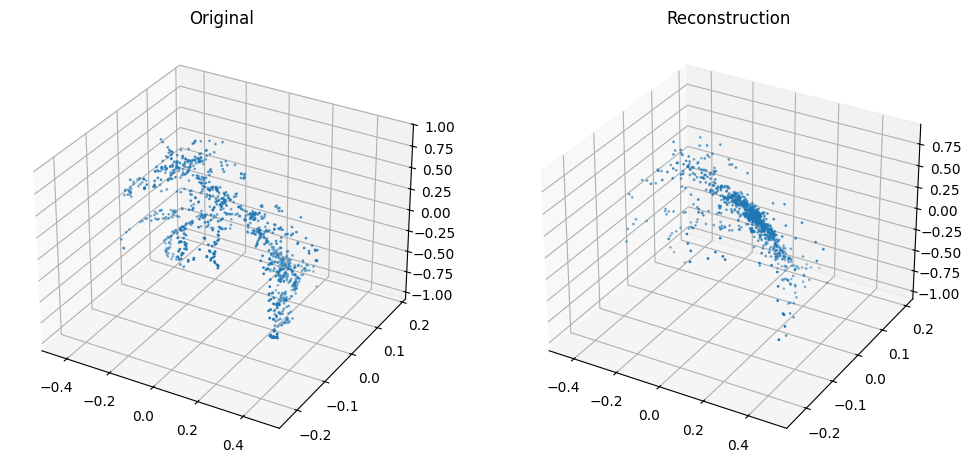

100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 326 Loss 0.0008866376324837643


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 327 Loss 0.0008754207150241922


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 328 Loss 0.0008596820518418792


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 329 Loss 0.0008615740308804172


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 330 Loss 0.0008505150640664238


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 331 Loss 0.0008762591686617169


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 332 Loss 0.0008650413697718509


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 333 Loss 0.0008891504442703629


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 334 Loss 0.0008760209136184245


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 335 Loss 0.0008552995831927373


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 336 Loss 0.0008531583118296805


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 337 Loss 0.0008837483871343827


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 338 Loss 0.0008896306667122103


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 339 Loss 0.0008542057346656091


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 340 Loss 0.0008395026698486791


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 341 Loss 0.0008194830956026202


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 342 Loss 0.000844205421070376


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 343 Loss 0.0008288375619384977


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 344 Loss 0.0008550111041773879


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 345 Loss 0.0008469254521298266


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 346 Loss 0.0008639988992067556


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 347 Loss 0.000840169602140252


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 348 Loss 0.0008533213394767944


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 349 Loss 0.0008492236772167777


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 350 Loss 0.0008593251714335074


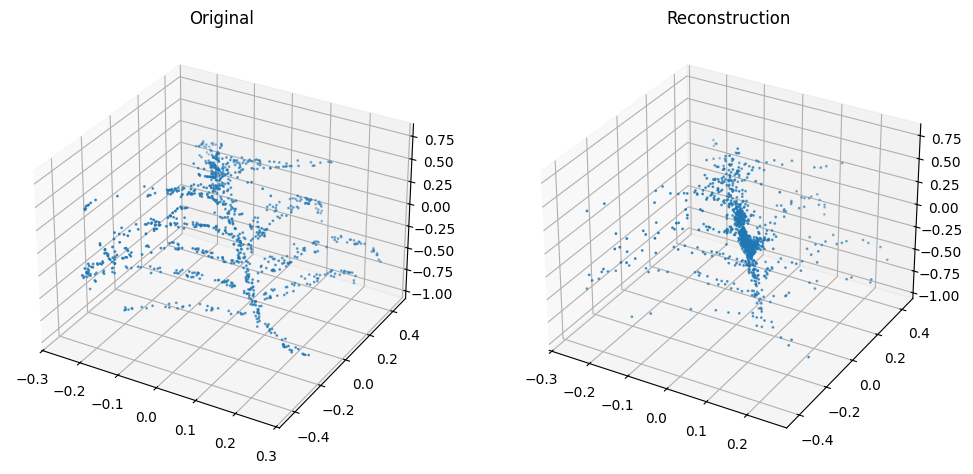

100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 351 Loss 0.0008382073553678181


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 352 Loss 0.0008295190396777813


100%|██████████| 63/63 [00:05<00:00, 12.20it/s]


Epoch 353 Loss 0.0008260175707705674


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 354 Loss 0.0008276608820620274


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 355 Loss 0.0008350931715944575


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 356 Loss 0.0008523225218855909


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 357 Loss 0.0008464333516294284


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 358 Loss 0.0008232423181956013


100%|██████████| 63/63 [00:05<00:00, 12.06it/s]


Epoch 359 Loss 0.0008118181130922739


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 360 Loss 0.000861084865709205


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 361 Loss 0.0008449019487237646


100%|██████████| 63/63 [00:05<00:00, 12.16it/s]


Epoch 362 Loss 0.0008391998856077118


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 363 Loss 0.0008312213338083691


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 364 Loss 0.0008186566512218662


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 365 Loss 0.0008402481094919263


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 366 Loss 0.000819402323695757


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 367 Loss 0.0008133939709440466


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 368 Loss 0.0008189131308066112


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 369 Loss 0.0008278060205546873


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 370 Loss 0.0008233403325051306


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 371 Loss 0.0008135553530698257


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 372 Loss 0.0007994205964403967


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 373 Loss 0.0007960528120516785


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 374 Loss 0.0008041418706332999


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 375 Loss 0.0007815055164789396


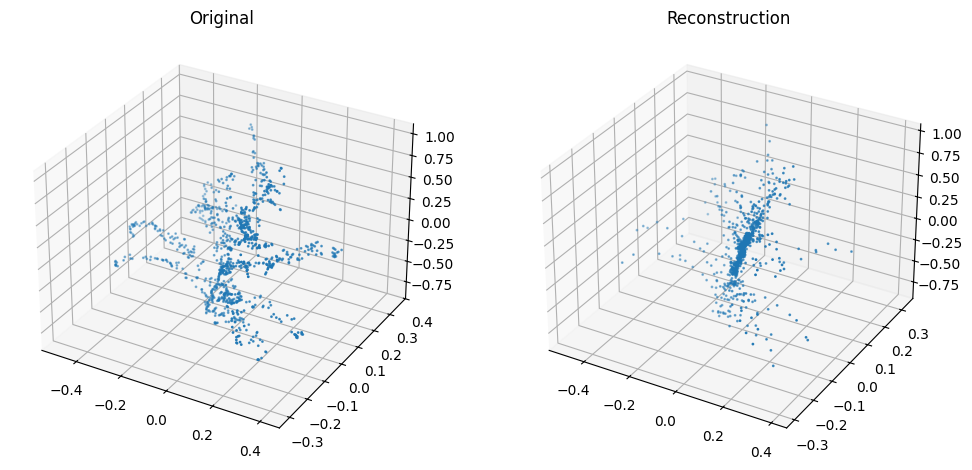

100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 376 Loss 0.0008304323446715162


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 377 Loss 0.000811207716146277


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 378 Loss 0.000803975709935739


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 379 Loss 0.0008155248092768329


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 380 Loss 0.000793802821713071


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 381 Loss 0.0007858585911832513


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 382 Loss 0.0007794763336682485


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 383 Loss 0.0007924373023256305


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 384 Loss 0.0007893342315958488


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 385 Loss 0.0007994274409221751


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 386 Loss 0.0008181736255729837


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 387 Loss 0.0007953083988959117


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 388 Loss 0.0008058679375117497


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 389 Loss 0.0008221162059935667


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 390 Loss 0.0007983552059158683


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 391 Loss 0.0007906732757368849


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 392 Loss 0.0007857638032412127


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 393 Loss 0.0008120182310304944


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 394 Loss 0.0008040092541791854


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 395 Loss 0.0008428979227097617


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 396 Loss 0.0007962146663062629


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 397 Loss 0.0007853460533263546


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 398 Loss 0.0007829853335380672


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 399 Loss 0.0007965342004946064


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 400 Loss 0.0007624928913419209


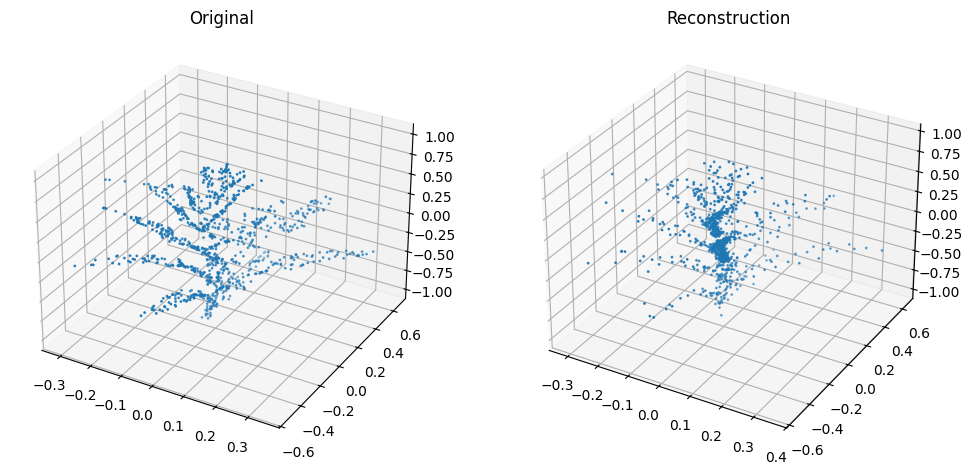

100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 401 Loss 0.0007757332124229935


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 402 Loss 0.0007804501034866368


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 403 Loss 0.0007507985463321564


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 404 Loss 0.0007400694330932484


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 405 Loss 0.0007620378173813816


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 406 Loss 0.0008125072040240324


100%|██████████| 63/63 [00:05<00:00, 12.13it/s]


Epoch 407 Loss 0.0007499803628195964


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 408 Loss 0.0007437336053477512


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 409 Loss 0.0007700382580330211


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 410 Loss 0.0007926476989976234


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 411 Loss 0.0007665407213766778


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 412 Loss 0.0007624055345779255


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 413 Loss 0.0007552176710247757


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 414 Loss 0.0007342809482314993


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 415 Loss 0.0007534566398207394


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 416 Loss 0.0007597404838879667


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 417 Loss 0.0007476540400631844


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 418 Loss 0.0007355912886042562


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 419 Loss 0.0007435756787243816


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 420 Loss 0.0007782536900661413


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 421 Loss 0.0007659981760846836


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


Epoch 422 Loss 0.0007546010125975406


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 423 Loss 0.0007396136024331171


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 424 Loss 0.0007295585782562811


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 425 Loss 0.0007658293803355523


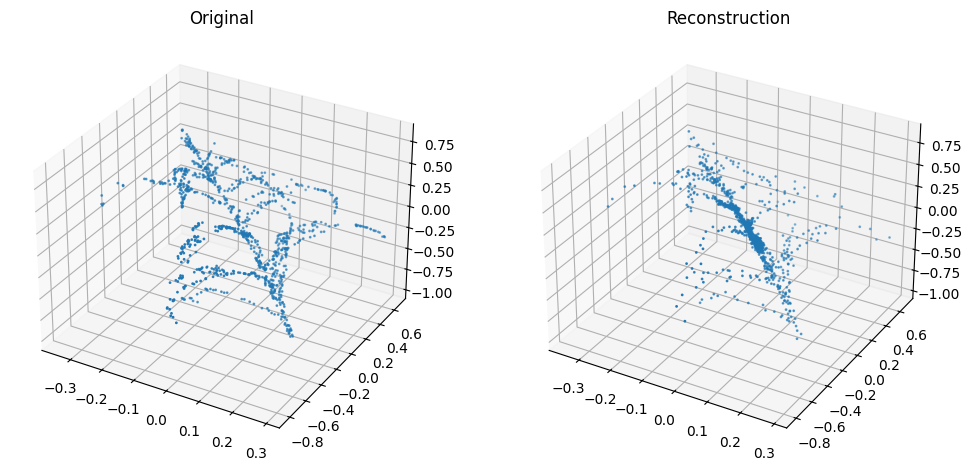

100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 426 Loss 0.0007834449957405764


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 427 Loss 0.0007629647318805967


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 428 Loss 0.0007429252339837452


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 429 Loss 0.0007339596770526398


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 430 Loss 0.0007569016934934235


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 431 Loss 0.0007441743519083257


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 432 Loss 0.0007364558238935258


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 433 Loss 0.0007382087309711746


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 434 Loss 0.0007420631120025757


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 435 Loss 0.0007497702812081173


100%|██████████| 63/63 [00:05<00:00, 12.19it/s]


Epoch 436 Loss 0.0007760970195430139


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 437 Loss 0.0007504979194703675


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 438 Loss 0.0007543383066409401


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 439 Loss 0.0007649024270312299


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 440 Loss 0.0007466233791857366


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 441 Loss 0.0007412565949683388


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 442 Loss 0.0007223119074109174


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 443 Loss 0.0007062556225776909


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 444 Loss 0.0007359766223955722


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 445 Loss 0.0007576221389518608


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 446 Loss 0.0007438523175623563


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 447 Loss 0.0007232881524407911


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 448 Loss 0.000733973448246067


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 449 Loss 0.0007285480091850909


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 450 Loss 0.0007442993302238248


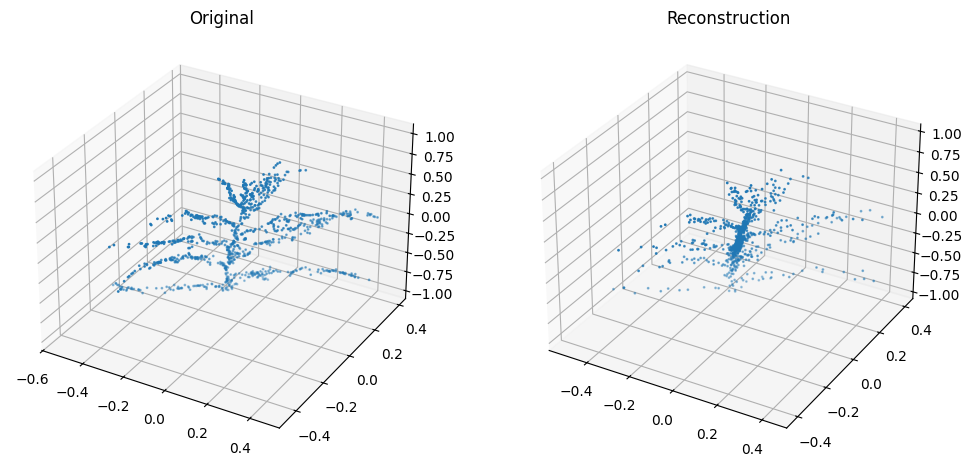

100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


Epoch 451 Loss 0.0007236830359842214


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 452 Loss 0.0007093852147504332


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 453 Loss 0.0007245044865172416


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 454 Loss 0.0007126676630125277


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 455 Loss 0.0007381241746424209


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 456 Loss 0.000733880915619906


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 457 Loss 0.000741444169617598


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 458 Loss 0.0007242365464908145


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 459 Loss 0.0007456011685823637


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 460 Loss 0.0007131259845909736


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 461 Loss 0.0007093437487215159


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 462 Loss 0.0007114912566196706


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 463 Loss 0.0006934641019648148


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 464 Loss 0.00067854174117129


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 465 Loss 0.0007134637091353181


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 466 Loss 0.0007032540410624019


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 467 Loss 0.0007217120090943007


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 468 Loss 0.0007255766143475378


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 469 Loss 0.0007374050088285927


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 470 Loss 0.0007198340821242522


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 471 Loss 0.0007788540152389379


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 472 Loss 0.0007292820817036997


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 473 Loss 0.0007236951441016226


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 474 Loss 0.0007283309879269273


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 475 Loss 0.0007075706666838082


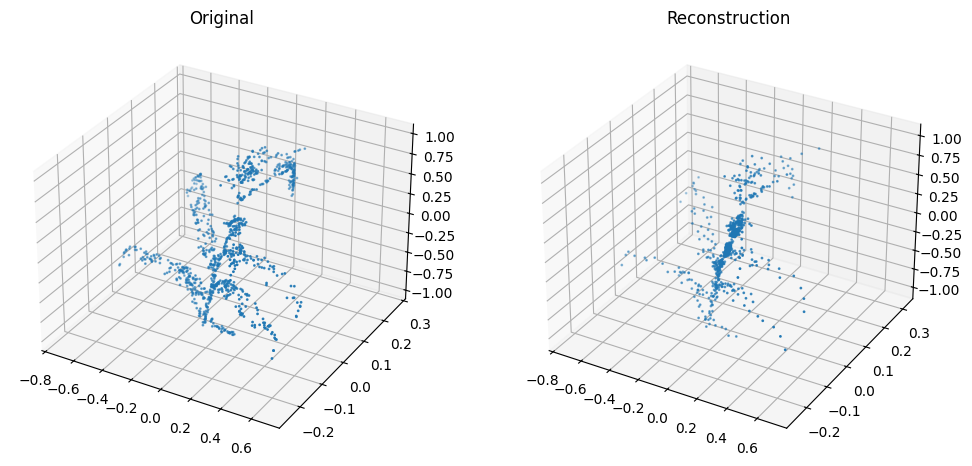

100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


Epoch 476 Loss 0.00069073211616053


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 477 Loss 0.0007151134131062361


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 478 Loss 0.0007178055553046602


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 479 Loss 0.0007034237746016256


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 480 Loss 0.000711137481543812


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 481 Loss 0.0007189650694647479


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 482 Loss 0.0007314012396991963


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 483 Loss 0.0007408279251115071


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 484 Loss 0.0007198561114140801


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 485 Loss 0.0006837588697967548


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 486 Loss 0.0006832471422274553


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 487 Loss 0.0006933787048587368


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 488 Loss 0.0006924599117141157


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 489 Loss 0.0006959907265217413


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 490 Loss 0.0006921539020295891


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 491 Loss 0.0006955289688434392


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 492 Loss 0.0006982112665557199


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 493 Loss 0.0007030176606753634


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 494 Loss 0.0006879199405259911


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 495 Loss 0.0006921802802632252


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 496 Loss 0.0006894282608603438


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 497 Loss 0.0007002087825510119


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 498 Loss 0.0007147484787902426


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 499 Loss 0.0006975945489968927


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 500 Loss 0.0006765592362849959


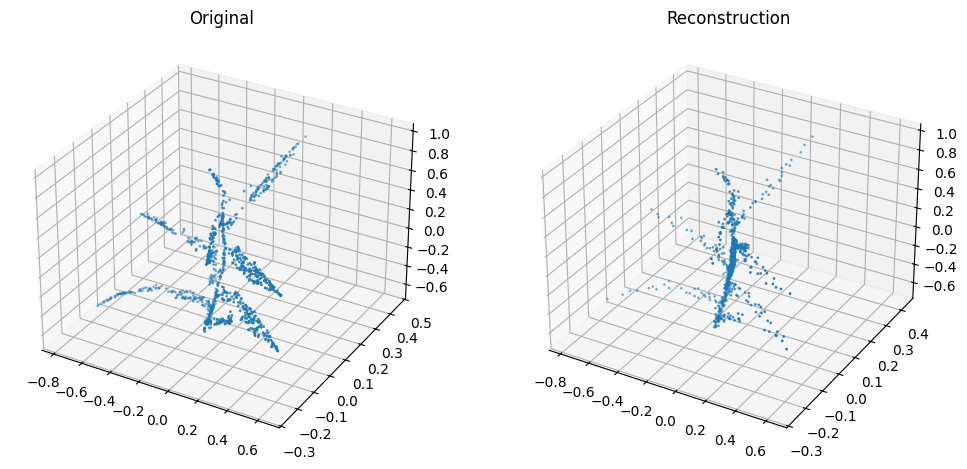

100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 501 Loss 0.0006646155656891919


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 502 Loss 0.0006861780430116351


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 503 Loss 0.0006794507295588061


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 504 Loss 0.0006796894770573884


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 505 Loss 0.0006841160541784669


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 506 Loss 0.0006873699945456807


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 507 Loss 0.0006939978800743581


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 508 Loss 0.0006884486739715886


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 509 Loss 0.0006932193877190234


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 510 Loss 0.0006783580627395875


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 511 Loss 0.000688348994738171


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 512 Loss 0.0006725082011331641


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 513 Loss 0.0006706527580270573


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 514 Loss 0.0006646075736849554


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 515 Loss 0.0006858678174293822


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 516 Loss 0.0006887809704205701


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 517 Loss 0.0006942426599192596


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 518 Loss 0.0006701423368963694


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 519 Loss 0.0006696249585643056


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 520 Loss 0.0006588462958230623


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 521 Loss 0.0006547973312008831


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 522 Loss 0.00069424984255983


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 523 Loss 0.0006929649500220659


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 524 Loss 0.0006977707251078553


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 525 Loss 0.0006982107214363557


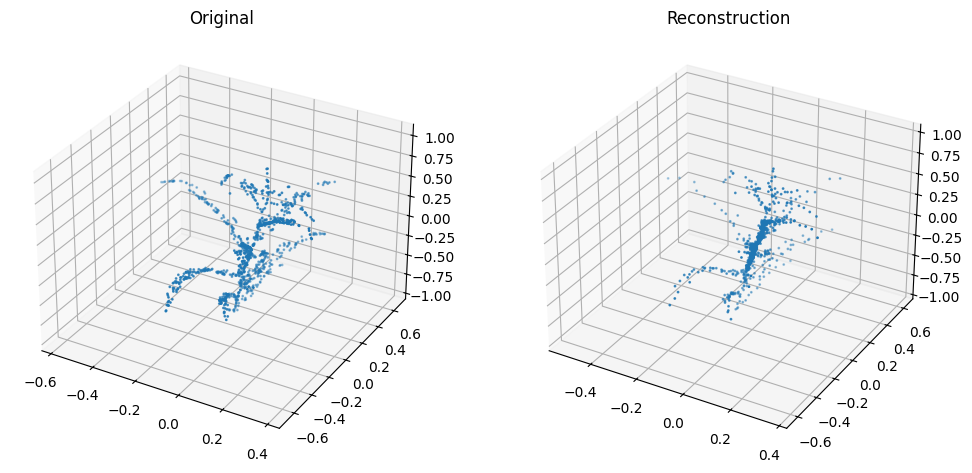

100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 526 Loss 0.0006840798370022741


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 527 Loss 0.0006697843958150655


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 528 Loss 0.0006817380864439267


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 529 Loss 0.0006716161188373845


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 530 Loss 0.0006901959007206772


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 531 Loss 0.0006694901339148008


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 532 Loss 0.0006672797451120993


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 533 Loss 0.000668370653690386


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 534 Loss 0.0006748732024182876


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 535 Loss 0.0006525259638678223


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 536 Loss 0.0006956517666814819


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 537 Loss 0.0006779907594641878


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 538 Loss 0.000688772422209796


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 539 Loss 0.0006640911525455377


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 540 Loss 0.0006510904280557519


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 541 Loss 0.0006510014026721437


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 542 Loss 0.0006655883884781764


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 543 Loss 0.0006611577395926274


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 544 Loss 0.0006484728886760653


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 545 Loss 0.0006458914112521424


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 546 Loss 0.0006463797079280964


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 547 Loss 0.0006592925813507348


100%|██████████| 63/63 [00:05<00:00, 12.16it/s]


Epoch 548 Loss 0.0006735894537072569


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 549 Loss 0.000650853868426075


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 550 Loss 0.0006379669805663446


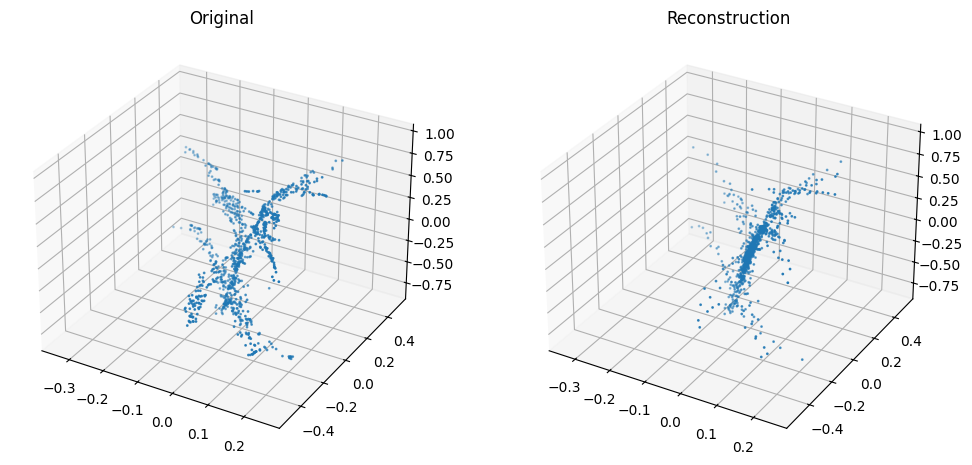

100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 551 Loss 0.0006448132612387694


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


Epoch 552 Loss 0.0006342819293162652


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 553 Loss 0.0006683459274456023


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 554 Loss 0.0006973442163259264


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 555 Loss 0.0006675391045901629


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 556 Loss 0.0006560480161126526


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 557 Loss 0.0006539375486133235


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 558 Loss 0.0006558488267252134


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 559 Loss 0.0006733881679200937


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 560 Loss 0.0006450413447242998


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 561 Loss 0.0006484744048470424


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 562 Loss 0.0006522316502274147


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 563 Loss 0.0006519899082680544


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 564 Loss 0.0006605703725538675


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 565 Loss 0.0006605855887755752


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 566 Loss 0.0006487571933705892


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 567 Loss 0.000629084223570923


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 568 Loss 0.000647199955502791


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 569 Loss 0.0006223767737133636


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 570 Loss 0.000624233391135931


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 571 Loss 0.0006324078468236304


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 572 Loss 0.0006670855107672867


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


Epoch 573 Loss 0.0006604565710331949


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 574 Loss 0.0006495261433652588


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 575 Loss 0.0006372026603905454


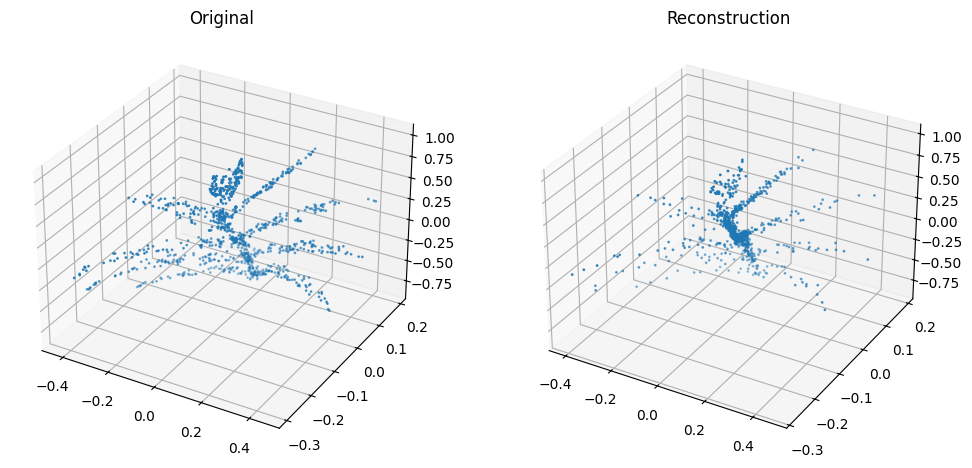

100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


Epoch 576 Loss 0.0006313662558409666


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 577 Loss 0.000646950352737414


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 578 Loss 0.000654731992639542


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 579 Loss 0.0006186094297657884


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 580 Loss 0.0006214701228715952


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 581 Loss 0.0006387692077883653


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 582 Loss 0.0006349676506712087


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


Epoch 583 Loss 0.0006638225556040803


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 584 Loss 0.0006717536284307403


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 585 Loss 0.0006546756513195024


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 586 Loss 0.0006384187875064238


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 587 Loss 0.000635214173050213


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 588 Loss 0.0006274656348285221


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 589 Loss 0.0006239576226410767


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 590 Loss 0.0006332541178424089


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 591 Loss 0.0006653545701521493


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 592 Loss 0.00065732292187888


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 593 Loss 0.0006422596625126306


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 594 Loss 0.0006442120186023651


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 595 Loss 0.0006449488268810368


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 596 Loss 0.000632729853451666


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 597 Loss 0.0006247902000766425


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 598 Loss 0.0006432983218618329


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 599 Loss 0.0006220930021270992


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 600 Loss 0.0006221249008492108


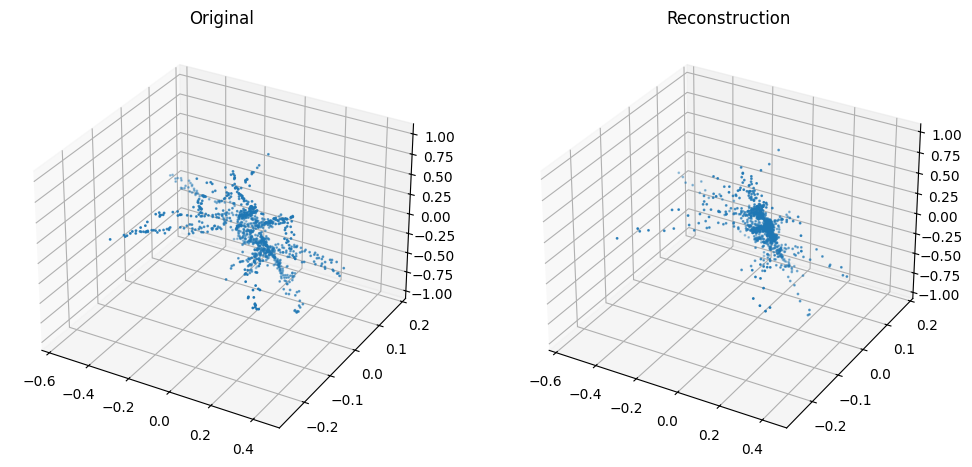

100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 601 Loss 0.0006180473442544185


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 602 Loss 0.0006346272365633576


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 603 Loss 0.0006391893229669048


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 604 Loss 0.0006285621239508073


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 605 Loss 0.0006216459127793473


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 606 Loss 0.0006140528703182344


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 607 Loss 0.0006307321203325594


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 608 Loss 0.000623663823630306


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 609 Loss 0.0006157453966489624


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 610 Loss 0.0006279300072319096


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 611 Loss 0.0006181126089012693


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 612 Loss 0.000628737756790268


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 613 Loss 0.0006128596687053759


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 614 Loss 0.0006301534816711431


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 615 Loss 0.0006233988743689326


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 616 Loss 0.000614832729167704


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 617 Loss 0.0006112691499145021


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 618 Loss 0.0006233035958194662


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 619 Loss 0.0006121601604501761


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 620 Loss 0.0006129496411183879


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 621 Loss 0.0006384040702075239


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 622 Loss 0.000604994162651045


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 623 Loss 0.0006029750146563091


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 624 Loss 0.0006244331385777701


100%|██████████| 63/63 [00:05<00:00, 12.20it/s]


Epoch 625 Loss 0.0006327026787893994


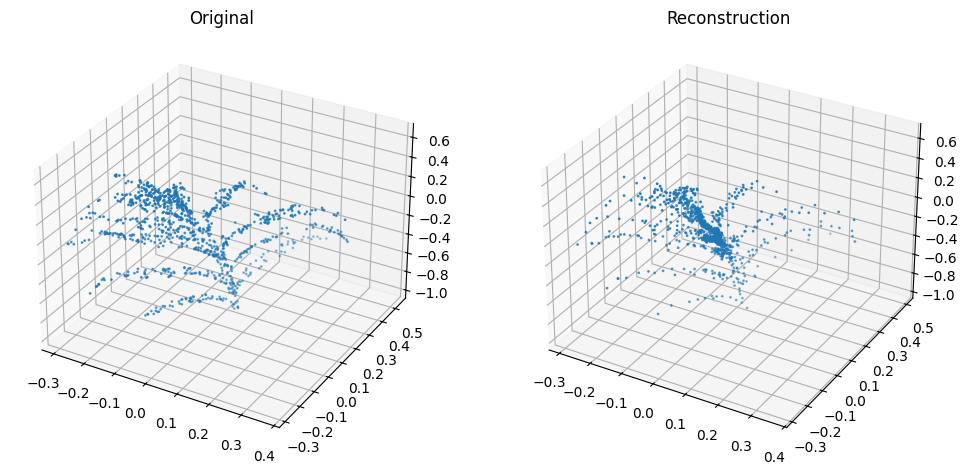

100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 626 Loss 0.000633146507584209


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 627 Loss 0.0006218421936316031


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 628 Loss 0.0006332009225078519


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 629 Loss 0.0006149532273411751


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 630 Loss 0.0006169608317404276


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 631 Loss 0.0006134867971201264


100%|██████████| 63/63 [00:05<00:00, 12.19it/s]


Epoch 632 Loss 0.0006021767307723326


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 633 Loss 0.000593851375881405


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 634 Loss 0.0006125187085542296


100%|██████████| 63/63 [00:05<00:00, 12.13it/s]


Epoch 635 Loss 0.0006076402233226137


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 636 Loss 0.000609010761965894


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 637 Loss 0.0006088419874671787


100%|██████████| 63/63 [00:05<00:00, 12.12it/s]


Epoch 638 Loss 0.0006079127418897336


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 639 Loss 0.0005949339321223161


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 640 Loss 0.000609842839554721


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 641 Loss 0.0006186734092244435


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 642 Loss 0.0006028384613316684


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 643 Loss 0.0006053319287722901


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 644 Loss 0.0006344598267109148


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 645 Loss 0.0006237392626067121


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 646 Loss 0.00061526521116436


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 647 Loss 0.0006090403536319851


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 648 Loss 0.0006042597251796415


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 649 Loss 0.0005942799228553971


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 650 Loss 0.0006005888304022687


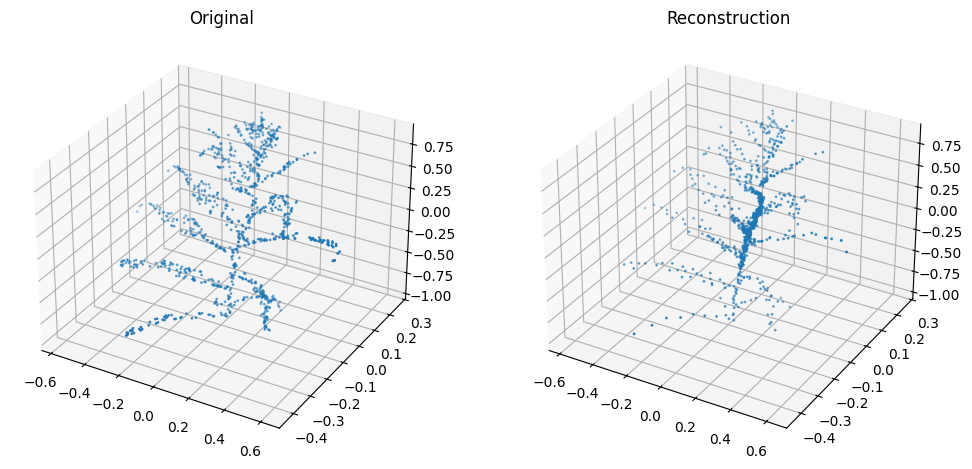

100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 651 Loss 0.0006096612436637755


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 652 Loss 0.0005972264510106355


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 653 Loss 0.0006355905613403708


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 654 Loss 0.0006433745600386626


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 655 Loss 0.0006123867499390765


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 656 Loss 0.0006072357193463378


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 657 Loss 0.000599382431357212


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 658 Loss 0.0006014127542989121


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 659 Loss 0.0005916570149739051


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 660 Loss 0.0005998891271976015


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 661 Loss 0.0005972741993092415


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 662 Loss 0.0006146854721009731


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 663 Loss 0.0006085788481868804


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 664 Loss 0.0005990617745925509


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 665 Loss 0.0005962489180207725


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 666 Loss 0.0005861476959017594


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 667 Loss 0.0005972925157818411


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 668 Loss 0.0005985379638519906


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 669 Loss 0.0006013738466352816


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 670 Loss 0.0006108953865126721


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 671 Loss 0.0006275695798519466


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 672 Loss 0.0006254626288344818


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 673 Loss 0.0006497531079701961


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


Epoch 674 Loss 0.0006255034702859582


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 675 Loss 0.0006144414314009722


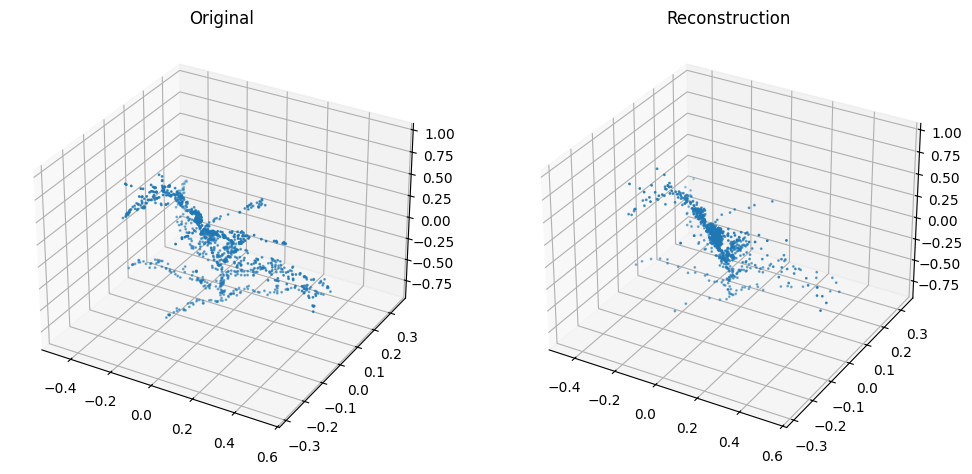

100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 676 Loss 0.0006001452871021771


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


Epoch 677 Loss 0.0006211990978391398


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 678 Loss 0.0005926915170950076


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 679 Loss 0.0005754409625845415


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 680 Loss 0.0005695637923458384


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 681 Loss 0.0005829852778420207


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 682 Loss 0.0005948816500936768


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 683 Loss 0.0005739250068833667


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 684 Loss 0.0005878439821702029


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 685 Loss 0.0005882030661543092


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 686 Loss 0.0005867154598938271


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 687 Loss 0.0005811493486232523


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 688 Loss 0.0005847565656054824


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 689 Loss 0.000600055174251634


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 690 Loss 0.0005922378484337102


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 691 Loss 0.0005754441048742996


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 692 Loss 0.0005905471182250906


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 693 Loss 0.000594796926995355


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 694 Loss 0.0005938692793567916


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 695 Loss 0.000614646163451234


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 696 Loss 0.0006189719535454753


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 697 Loss 0.0005971886576079424


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 698 Loss 0.0005786455229907814


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 699 Loss 0.0005855058404868321


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 700 Loss 0.0005840213792879016


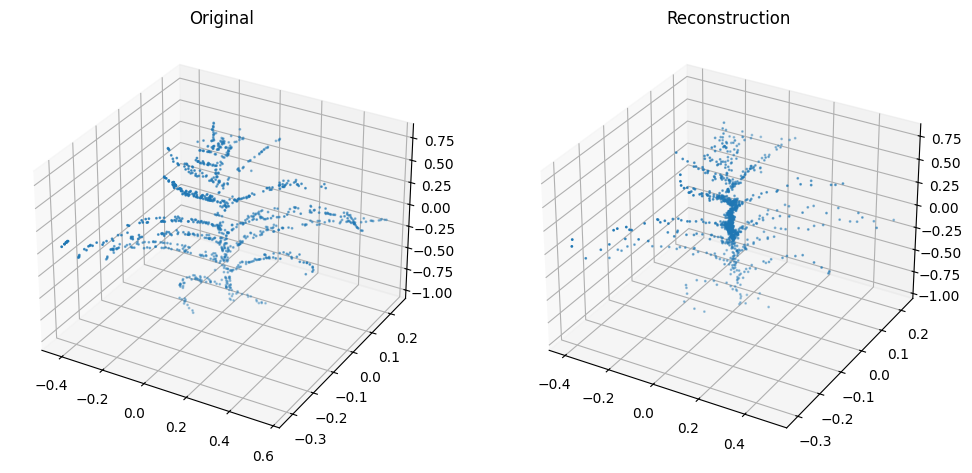

100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 701 Loss 0.0005845153521347259


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 702 Loss 0.0005851892896720932


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 703 Loss 0.0005848956819150656


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 704 Loss 0.0005849459326811253


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 705 Loss 0.0005986961501000064


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 706 Loss 0.0005939388897136918


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 707 Loss 0.0005934274716613194


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 708 Loss 0.0005775598914451187


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 709 Loss 0.0005810505688367855


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 710 Loss 0.0005866562405283312


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 711 Loss 0.0005704255710865947


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 712 Loss 0.0005766849656264106


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 713 Loss 0.0005805965828051465


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 714 Loss 0.000585716664015005


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 715 Loss 0.000590631025954194


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 716 Loss 0.0005965142137563181


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 717 Loss 0.0006071351688458688


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 718 Loss 0.000592435121587995


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 719 Loss 0.0005835784892071156


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 720 Loss 0.0005699380629858564


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 721 Loss 0.0005751914688430372


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 722 Loss 0.0005778755603675982


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 723 Loss 0.0005859452482712056


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 724 Loss 0.0005764630429136256


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 725 Loss 0.0005638058674300001


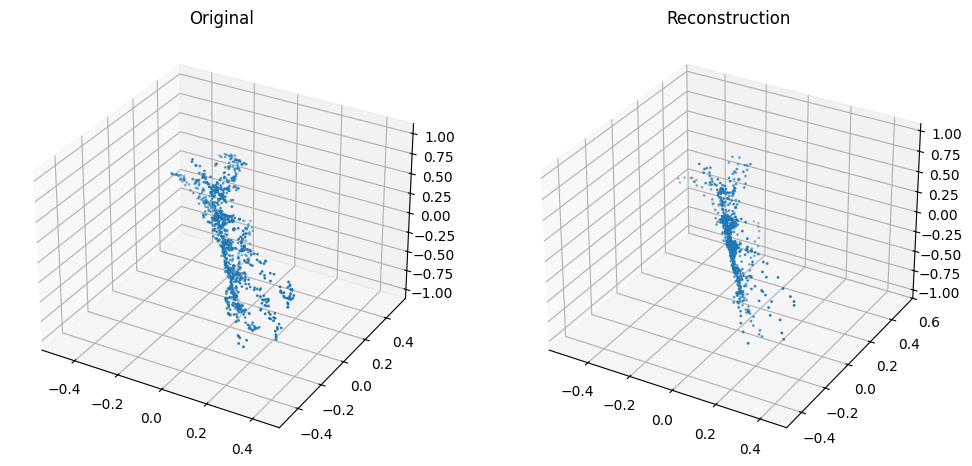

100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 726 Loss 0.000562335498490563


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 727 Loss 0.0005702648685121584


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 728 Loss 0.000568380154344061


100%|██████████| 63/63 [00:05<00:00, 12.14it/s]


Epoch 729 Loss 0.0005804259937057006


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 730 Loss 0.0005803443269715423


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 731 Loss 0.0005830470805189439


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 732 Loss 0.0005638598642748086


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 733 Loss 0.0005860454162641887


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 734 Loss 0.0005876062218920284


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 735 Loss 0.0005732081217935221


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 736 Loss 0.0005701136260685171


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 737 Loss 0.0005683491934120418


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 738 Loss 0.0005763426472965096


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 739 Loss 0.000579925964490348


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 740 Loss 0.0005801254633947142


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 741 Loss 0.0005676315446931219


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 742 Loss 0.0005635649542368594


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 743 Loss 0.0005755152669735253


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 744 Loss 0.0005741955985921243


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 745 Loss 0.0005879423965419096


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 746 Loss 0.0005877084858227699


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 747 Loss 0.000575777401016759


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 748 Loss 0.000573116726064611


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 749 Loss 0.0005701103608959191


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 750 Loss 0.0005545243805658723


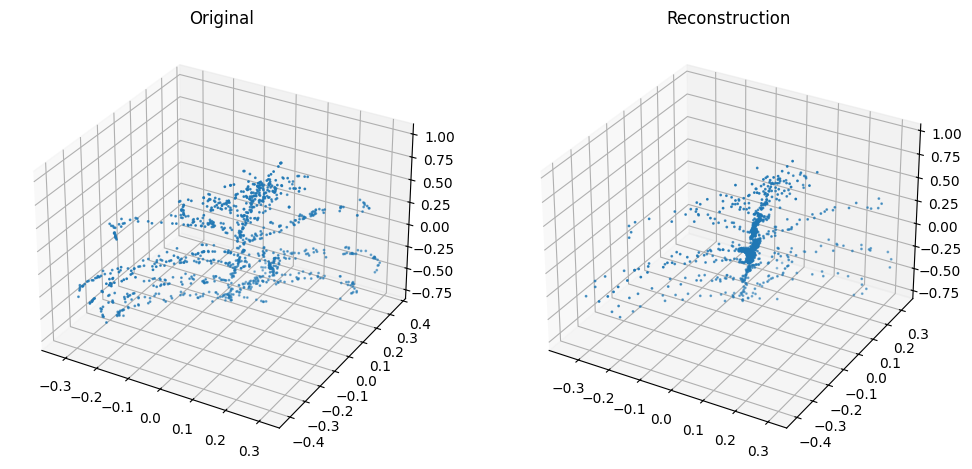

100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 751 Loss 0.0005536356271939382


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 752 Loss 0.0005569533894895502


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 753 Loss 0.000568152731931251


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 754 Loss 0.0005815708270621678


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 755 Loss 0.0005880040190522633


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 756 Loss 0.0005801868932654283


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 757 Loss 0.0005810795955189932


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 758 Loss 0.0005688526129926599


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 759 Loss 0.0005585513177460857


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 760 Loss 0.0005504002550705558


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 761 Loss 0.0005607251969483932


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 762 Loss 0.0005676287964599887


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 763 Loss 0.0005607090341592473


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 764 Loss 0.0005620785407714605


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 765 Loss 0.0005670881553900442


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 766 Loss 0.0005643640290058794


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


Epoch 767 Loss 0.0005674302381175082


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 768 Loss 0.000581637072923874


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 769 Loss 0.0005849698782041077


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 770 Loss 0.0005690466717905586


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


Epoch 771 Loss 0.0005647435254003438


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 772 Loss 0.0005650620557375193


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 773 Loss 0.000563652622365644


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 774 Loss 0.0005512849704015054


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 775 Loss 0.0005452298191523859


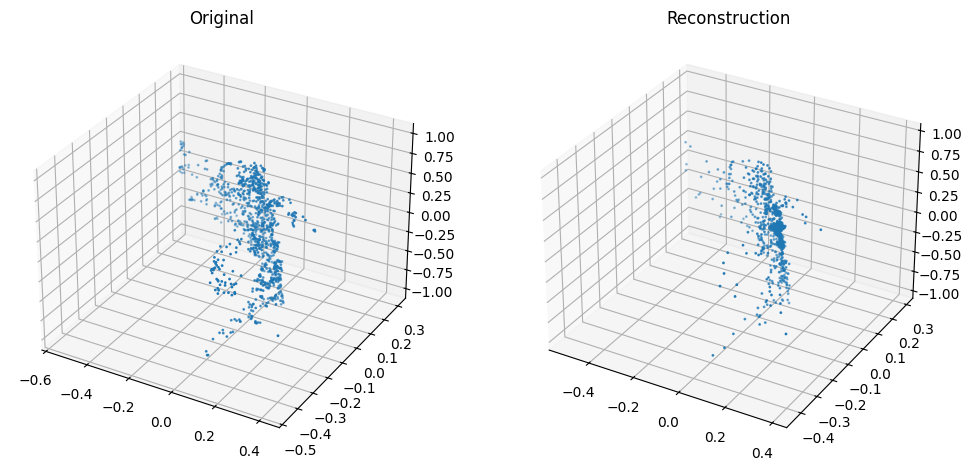

100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 776 Loss 0.0005587982891556171


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 777 Loss 0.0005669151700752241


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 778 Loss 0.0005587699392529589


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 779 Loss 0.0005480608462156462


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 780 Loss 0.0005609555828702887


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 781 Loss 0.0005748308677640227


100%|██████████| 63/63 [00:05<00:00, 12.20it/s]


Epoch 782 Loss 0.0005874437194997592


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 783 Loss 0.0005930455439420979


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 784 Loss 0.0005690697723785268


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 785 Loss 0.0005640892181656367


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 786 Loss 0.000553880520682368


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 787 Loss 0.0005497600701231037


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 788 Loss 0.0005559419990435893


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 789 Loss 0.0005494497775558442


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 790 Loss 0.0005673004008482196


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 791 Loss 0.0005509544853194956


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 792 Loss 0.000553934451466101


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 793 Loss 0.0005540746145896496


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 794 Loss 0.0005446725662627686


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 795 Loss 0.0005563597988507282


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 796 Loss 0.0005535849264734203


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 797 Loss 0.0005648059891499874


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 798 Loss 0.0005620523136005633


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 799 Loss 0.0005460784974737123


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 800 Loss 0.0005419125530077884


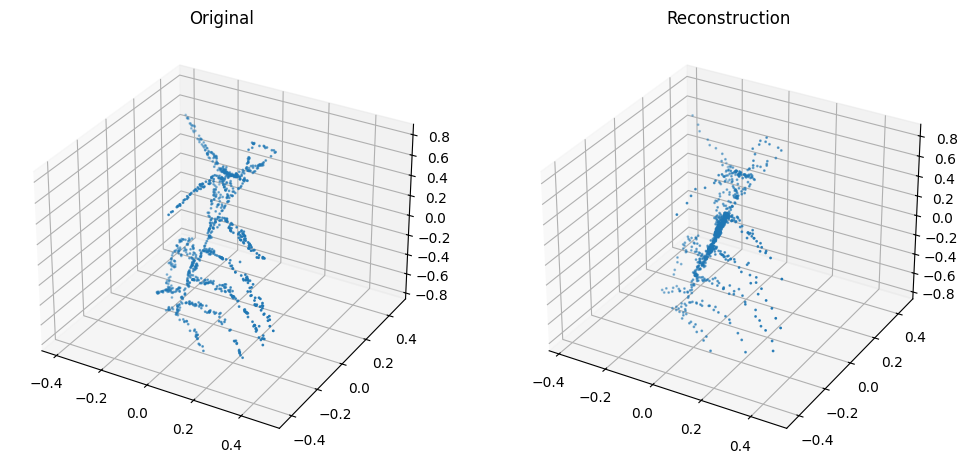

100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 801 Loss 0.0005550455484014477


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 802 Loss 0.0005586309084070048


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 803 Loss 0.0005677150551318413


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


Epoch 804 Loss 0.0005636286957832496


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 805 Loss 0.000564212822595552


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 806 Loss 0.0005663775253139199


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 807 Loss 0.0005518506767989565


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 808 Loss 0.0005656030132538743


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 809 Loss 0.0005902521735397241


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 810 Loss 0.0005538983751894049


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 811 Loss 0.0005570642658442791


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 812 Loss 0.0005379329077042047


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 813 Loss 0.0005535687184116492


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 814 Loss 0.0005574359882822526


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 815 Loss 0.0005460338207841334


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 816 Loss 0.0005427964562032786


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 817 Loss 0.0005419813835668186


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 818 Loss 0.0005466721176783303


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 819 Loss 0.0005501143339585276


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 820 Loss 0.0005540780483796778


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 821 Loss 0.0005644155169157164


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 822 Loss 0.0005566259663152907


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 823 Loss 0.0005410635235926344


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 824 Loss 0.0005372426752555406


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 825 Loss 0.0005533077748536709


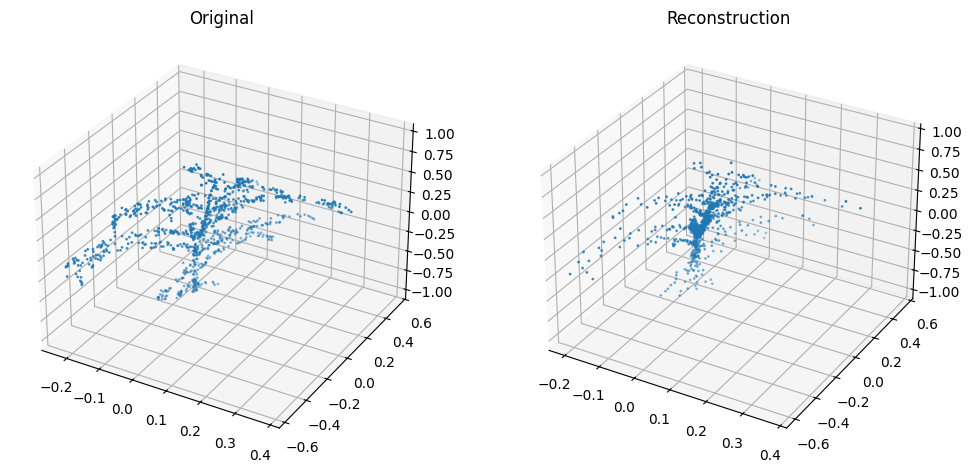

100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 826 Loss 0.0005521052299873046


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 827 Loss 0.0005725135944510204


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 828 Loss 0.0005723497324941


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 829 Loss 0.000556712229606799


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 830 Loss 0.00054010090793276


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 831 Loss 0.0005464685687218749


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 832 Loss 0.0005503468610908068


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 833 Loss 0.000554579905130797


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 834 Loss 0.0005442837755831461


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 835 Loss 0.0005395374734819468


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 836 Loss 0.0005391589425955086


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 837 Loss 0.0005592395337150683


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 838 Loss 0.0005521613620369444


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 839 Loss 0.0005488519922697119


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 840 Loss 0.0005452226914857175


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 841 Loss 0.0005330430317877068


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 842 Loss 0.0005385754948725836


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 843 Loss 0.000538947091655924


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 844 Loss 0.000551095073451362


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 845 Loss 0.0005517409775324816


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 846 Loss 0.0005337721663564148


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 847 Loss 0.0005361664160672161


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 848 Loss 0.0005245986505455914


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 849 Loss 0.000527166463490132


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 850 Loss 0.0005414176437567683


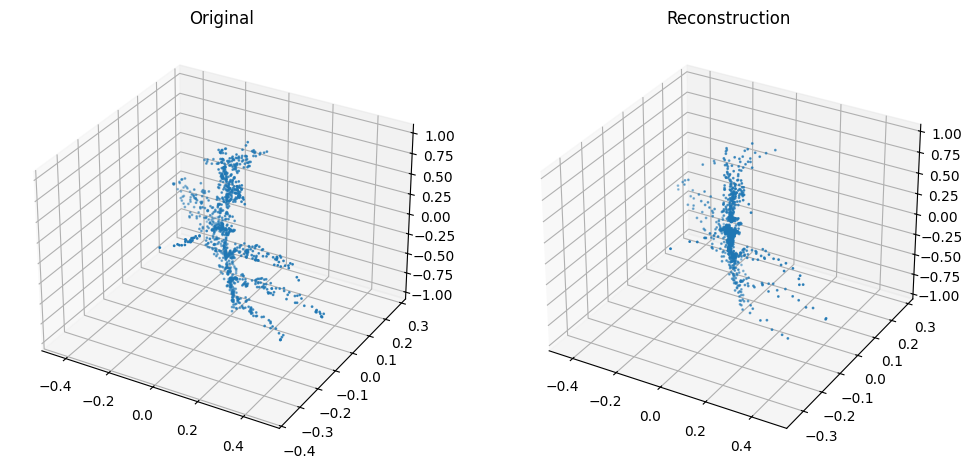

100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 851 Loss 0.0005504596920218319


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 852 Loss 0.0005346158406667648


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 853 Loss 0.0005320494071513947


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 854 Loss 0.0005337343738776528


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 855 Loss 0.0005400530889534228


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 856 Loss 0.0005411205791114341


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 857 Loss 0.0005524413214833845


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 858 Loss 0.0005407114490120125


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 859 Loss 0.0005239362709246398


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 860 Loss 0.000527292938112089


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 861 Loss 0.0005437483658112349


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 862 Loss 0.0005569458465158407


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 863 Loss 0.0005638836846051235


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 864 Loss 0.0005373872898792523


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 865 Loss 0.0005330088939185121


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 866 Loss 0.000544171835321726


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 867 Loss 0.0005615488279588698


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 868 Loss 0.0005511444571080603


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 869 Loss 0.0005474174127263564


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 870 Loss 0.0005416148827256014


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 871 Loss 0.0005407782339875305


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 872 Loss 0.0005328255758199486


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 873 Loss 0.0005281532260899743


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 874 Loss 0.0005224978579910442


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 875 Loss 0.0005169685778488952


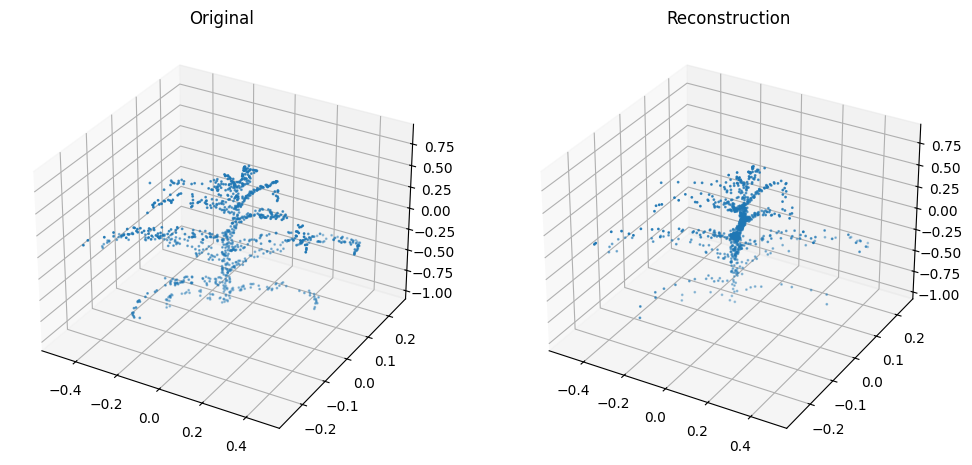

100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 876 Loss 0.0005227693879518598


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 877 Loss 0.0005265090051883211


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 878 Loss 0.0005473311688374018


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


Epoch 879 Loss 0.0005505078778018258


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 880 Loss 0.0005479276499947503


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 881 Loss 0.0005342332980713793


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 882 Loss 0.0005442331972835023


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 883 Loss 0.000536705071147206


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 884 Loss 0.0005371646137006344


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 885 Loss 0.0005318684593981339


100%|██████████| 63/63 [00:05<00:00, 12.36it/s]


Epoch 886 Loss 0.0005250502565306508


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 887 Loss 0.0005285969324639097


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 888 Loss 0.0005461813554921676


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 889 Loss 0.0005446534796935757


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 890 Loss 0.0005340164126310912


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 891 Loss 0.0005318380879341728


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 892 Loss 0.0005295446363373823


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 893 Loss 0.0005278237619518583


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


Epoch 894 Loss 0.000528381954941396


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 895 Loss 0.0005386621790147195


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 896 Loss 0.0005353828767381076


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


Epoch 897 Loss 0.0005255866987955948


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 898 Loss 0.0005328138733083117


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 899 Loss 0.000529167984264888


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 900 Loss 0.0005391329316244949


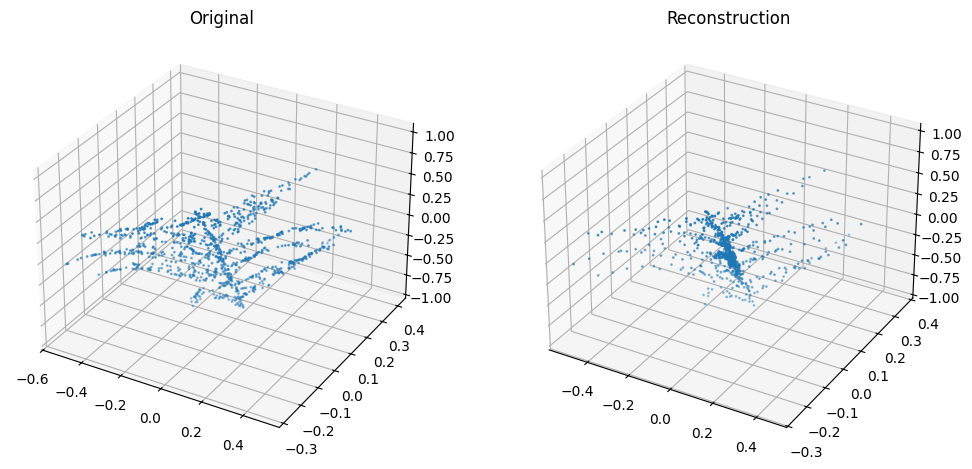

100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 901 Loss 0.0005358945331647105


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 902 Loss 0.0005423136019436199


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 903 Loss 0.0005431032087284303


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 904 Loss 0.000531793731386729


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 905 Loss 0.0005468505611162751


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 906 Loss 0.0005333058005716237


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 907 Loss 0.0005358589082283692


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 908 Loss 0.0005372595333028585


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 909 Loss 0.0005233879242691078


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 910 Loss 0.0005214076442089642


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 911 Loss 0.0005127639391474308


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 912 Loss 0.00051065619123937


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 913 Loss 0.000512110263419648


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 914 Loss 0.0005273571573308713


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 915 Loss 0.0005338449462590414


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 916 Loss 0.0005369754688304273


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


Epoch 917 Loss 0.0005203854155889343


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 918 Loss 0.0005172891311332701


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 919 Loss 0.0005266794113494041


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 920 Loss 0.0005354592899998857


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 921 Loss 0.0005319579652259274


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 922 Loss 0.00052485280598159


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 923 Loss 0.0005229170552440106


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


Epoch 924 Loss 0.000536024291437888


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 925 Loss 0.0005419904533367131


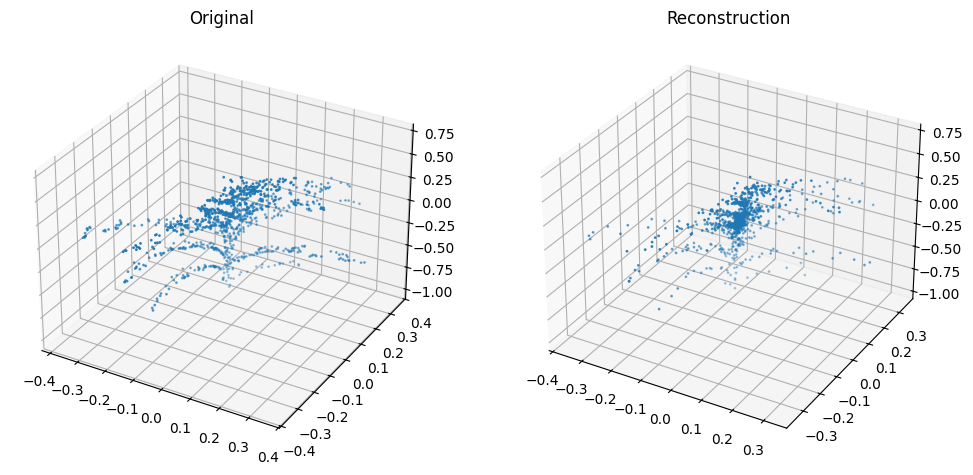

100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 926 Loss 0.0005491193460618397


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 927 Loss 0.0005428537112912015


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 928 Loss 0.0005265104557601883


100%|██████████| 63/63 [00:05<00:00, 12.17it/s]


Epoch 929 Loss 0.0005194984643446607


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 930 Loss 0.0005278217967503541


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 931 Loss 0.0005216519870344431


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 932 Loss 0.0005201442279882492


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


Epoch 933 Loss 0.0005237159563139791


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 934 Loss 0.0005334248962176461


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 935 Loss 0.0005260444988149204


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 936 Loss 0.0005364715484791391


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 937 Loss 0.0005352317867431021


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 938 Loss 0.0005368656554584583


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 939 Loss 0.0005372854070701


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 940 Loss 0.0005302029751455559


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


Epoch 941 Loss 0.0005144384529788993


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 942 Loss 0.0005187162624058565


100%|██████████| 63/63 [00:05<00:00, 12.26it/s]


Epoch 943 Loss 0.0005306148132871068


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 944 Loss 0.0005195246185249988


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


Epoch 945 Loss 0.0005073028908569425


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 946 Loss 0.0005023858573709038


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 947 Loss 0.0005091496402331229


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 948 Loss 0.0005246354267001152


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 949 Loss 0.0005222585048556091


100%|██████████| 63/63 [00:05<00:00, 12.45it/s]


Epoch 950 Loss 0.0005291403929096838


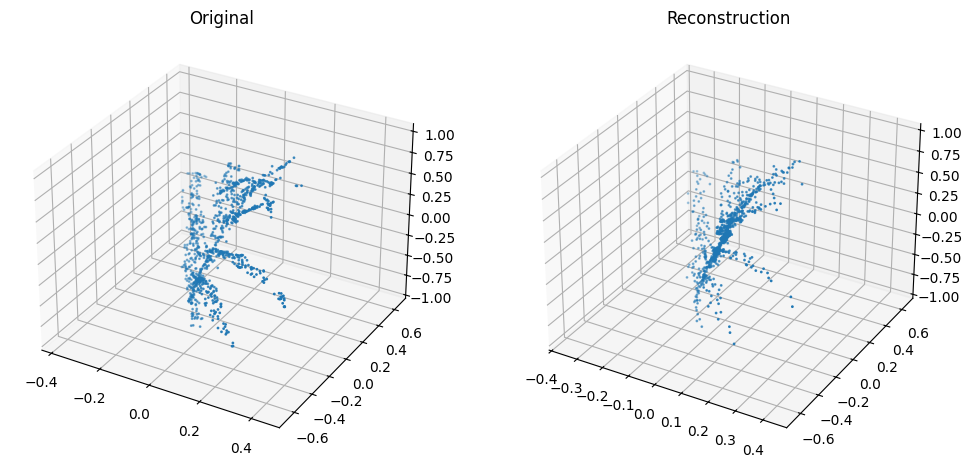

100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 951 Loss 0.0005267462074120958


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 952 Loss 0.0005256969616600564


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 953 Loss 0.0005320443809660714


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


Epoch 954 Loss 0.000546699758001884


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


Epoch 955 Loss 0.000521619305742668


100%|██████████| 63/63 [00:05<00:00, 12.30it/s]


Epoch 956 Loss 0.0005149051342861697


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


Epoch 957 Loss 0.0005099183744898746


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


Epoch 958 Loss 0.0005138532405475243


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 959 Loss 0.0005211518584964945


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 960 Loss 0.0005288248020593845


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 961 Loss 0.000523640333475279


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 962 Loss 0.0005290495658603808


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


Epoch 963 Loss 0.0005375039999351083


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


Epoch 964 Loss 0.000522697065857106


100%|██████████| 63/63 [00:05<00:00, 12.48it/s]


Epoch 965 Loss 0.0005061427835330722


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 966 Loss 0.0005134537239514646


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 967 Loss 0.000510629406014073


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 968 Loss 0.0005184740492416221


100%|██████████| 63/63 [00:05<00:00, 12.28it/s]


Epoch 969 Loss 0.0005122619904651646


100%|██████████| 63/63 [00:05<00:00, 12.25it/s]


Epoch 970 Loss 0.0005179771045703323


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


Epoch 971 Loss 0.0005161122530735734


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


Epoch 972 Loss 0.0005144830839338876


100%|██████████| 63/63 [00:05<00:00, 12.27it/s]


Epoch 973 Loss 0.0005102810220763324


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 974 Loss 0.0005094781028298986


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 975 Loss 0.000519629873220794


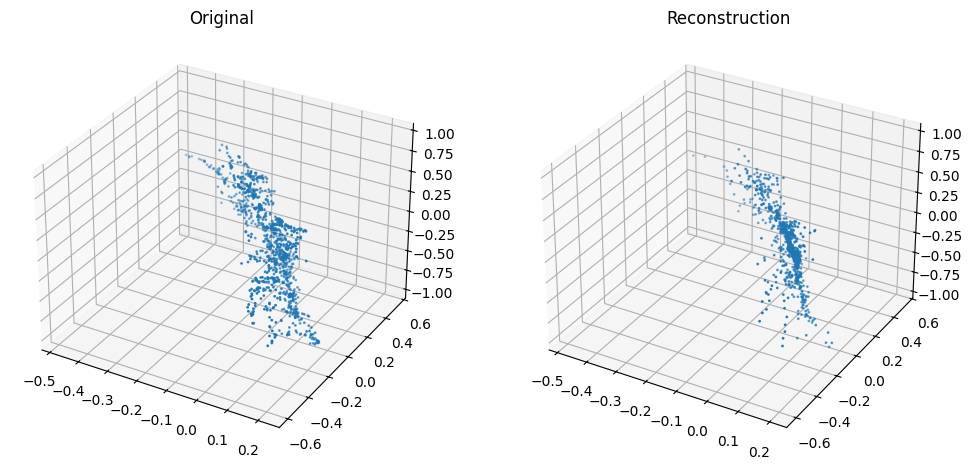

100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 976 Loss 0.0005317911873423746


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 977 Loss 0.0005095638782857725


100%|██████████| 63/63 [00:05<00:00, 12.51it/s]


Epoch 978 Loss 0.0005176865065189463


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


Epoch 979 Loss 0.000510565053287243


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


Epoch 980 Loss 0.0005091110217599346


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


Epoch 981 Loss 0.000513552926898387


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


Epoch 982 Loss 0.0005057370812181265


100%|██████████| 63/63 [00:05<00:00, 12.24it/s]


Epoch 983 Loss 0.0005319251850735219


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 984 Loss 0.0005297187885772141


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 985 Loss 0.0005430170221232055


100%|██████████| 63/63 [00:05<00:00, 12.29it/s]


Epoch 986 Loss 0.0005261654829761634


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


Epoch 987 Loss 0.0005199673903426008


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 988 Loss 0.0005152926961373952


100%|██████████| 63/63 [00:05<00:00, 12.39it/s]


Epoch 989 Loss 0.00051031669736692


100%|██████████| 63/63 [00:05<00:00, 12.23it/s]


Epoch 990 Loss 0.000507291368511875


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


Epoch 991 Loss 0.0005290455319770863


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


Epoch 992 Loss 0.000524599574476717


100%|██████████| 63/63 [00:05<00:00, 12.43it/s]


Epoch 993 Loss 0.0005151103088994407


100%|██████████| 63/63 [00:05<00:00, 12.37it/s]


Epoch 994 Loss 0.0005213101334418984


100%|██████████| 63/63 [00:05<00:00, 12.47it/s]


Epoch 995 Loss 0.0005210236039212239


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


Epoch 996 Loss 0.0005223520903012878


100%|██████████| 63/63 [00:05<00:00, 12.35it/s]


Epoch 997 Loss 0.0005256259801893658


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


Epoch 998 Loss 0.00051388419039237


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]

Epoch 999 Loss 0.0004967448767274618


In [ ]:
model = PointAutoEncoder().to(DEVICE)

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=CFG["lr"]
)

train_losses = []  # track loss per epoch for log-scale plotting

for epoch in range(CFG["epochs"]):

    model.train()

    total_loss = 0

    for pc in tqdm(loader):

        pc = pc.to(DEVICE)

        recon = model(pc)

        loss = chamfer_loss(pc, recon)

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(loader)

    print(f"Epoch {epoch} Loss {avg_loss}")

    train_losses.append(avg_loss)

    wandb.log({
        "epoch": epoch,
        "loss": avg_loss
    })

    # checkpoint
    if epoch % CFG["checkpoint_interval"] == 0:

        torch.save(
            model.state_dict(),
            f"checkpoint_epoch_{epoch}.pth"
        )

        # visualize reconstruction
        log_reconstruction(model, dataset, DEVICE, epoch)

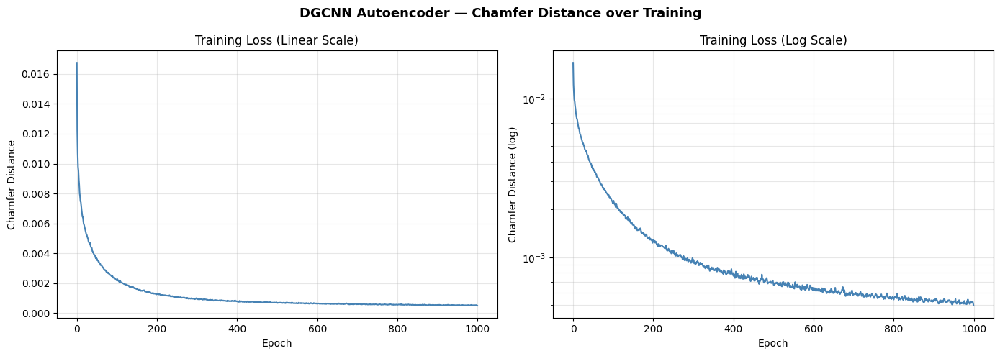

Min train loss: 0.000497 at epoch 999


In [ ]:
# ── Plot Training Loss (Log Scale) ──────────────────────────────────
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Linear scale
axes[0].plot(train_losses, color='steelblue', linewidth=1.5)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Chamfer Distance')
axes[0].set_title('Training Loss (Linear Scale)')
axes[0].grid(True, alpha=0.3)

# Log scale
axes[1].plot(train_losses, color='steelblue', linewidth=1.5)
axes[1].set_yscale('log')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Chamfer Distance (log)')
axes[1].set_title('Training Loss (Log Scale)')
axes[1].grid(True, which='both', alpha=0.3)

plt.suptitle('DGCNN Autoencoder — Chamfer Distance over Training', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('loss_curve_log_scale.png', dpi=150, bbox_inches='tight')
plt.show()

# Also log the final plot to W&B
wandb.log({'loss_curve': wandb.Image('loss_curve_log_scale.png')})
print(f'Min train loss: {min(train_losses):.6f} at epoch {np.argmin(train_losses)}')


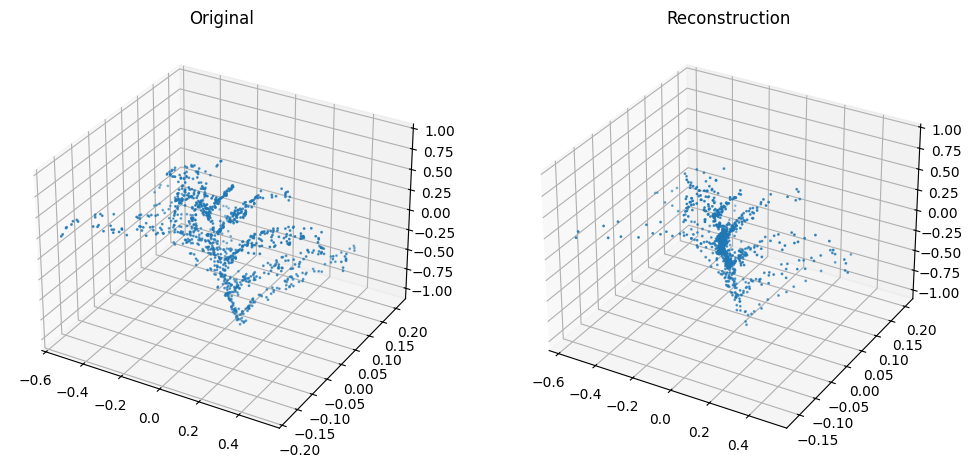

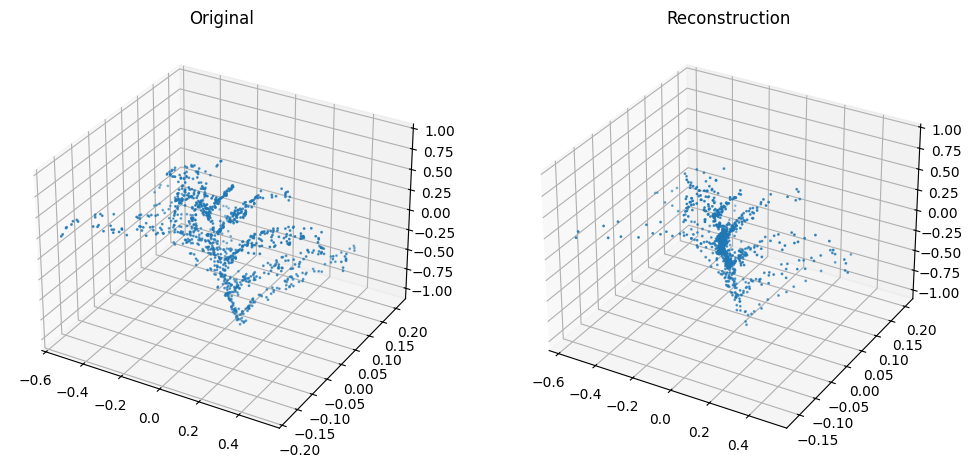

In [ ]:
visualize_reconstruction(model, dataset, DEVICE)

## Testing and Validation

In [ ]:
os.makedirs("data", exist_ok=True)

print("📥 Downloading raw point clouds (10k points per plant)...")

zip_path = hf_hub_download(
    repo_id="BGLab/MaizeField3D",
    filename="datasets/FielGrwon_ZeaMays_RawPCD_10k.zip",
    repo_type="dataset",
    local_dir="data"
)

print("📦 Extracting...")

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(CFG["data_dir"])

ply_files = sorted(glob.glob(f"{CFG['data_dir']}/**/*.ply", recursive=True))

print(f"✅ Found {len(ply_files)} plant files.")

📥 Downloading raw point clouds (10k points per plant)...
📦 Extracting...
✅ Found 1045 plant files.


In [ ]:
import random
random.seed(42)
val_files = ply_files[500:700]
test_files = ply_files[700:1000]

In [ ]:
val_dataset = MaizeDataset(val_files)
test_dataset = MaizeDataset(test_files)

In [ ]:
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

In [ ]:
model = PointAutoEncoder().to(DEVICE)

model.load_state_dict(torch.load("checkpoint_epoch_475.pth"))

model.eval()

PointAutoEncoder(
  (encoder): DGCNN_Encoder(
    (conv1): Sequential(
      (0): Conv2d(6, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (conv2): Sequential(
      (0): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (conv3): Sequential(
      (0): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (fc): Linear(in_features=256, out_features=256, bias=True)
  )
  (decoder): Decoder(
    (mlp): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): ReLU()
      (2): Linear(in_features=512, out_features=1024, bias=True)
      (3): ReLU()


In [ ]:
def evaluate(model, loader):

    model.eval()

    total_loss = 0

    with torch.no_grad():

        for pc in loader:

            pc = pc.to(DEVICE)

            recon = model(pc)

            loss = chamfer_loss(pc, recon)

            total_loss += loss.item()

    avg_loss = total_loss / len(loader)

    return avg_loss

In [ ]:
val_loss = evaluate(model, val_loader)
test_loss = evaluate(model, test_loader)

print("Validation Chamfer:", val_loss)
print("Test Chamfer:", test_loss)

wandb.log({
    "final_val_loss": val_loss,
    "final_test_loss": test_loss
})

Validation Chamfer: 0.0032769968174397946
Test Chamfer: 0.003464193720566599


In [ ]:
test_loss = evaluate(model, test_loader)

print("Final Test Chamfer Loss:", test_loss)

Final Test Chamfer Loss: 0.003481750315251319


In [ ]:
import matplotlib.pyplot as plt
import numpy as np


def visualize_test_reconstruction(model, dataset, num_samples=5):

    model.eval()

    for i in range(num_samples):

        idx = np.random.randint(len(dataset))

        pc = dataset[idx].unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            recon = model(pc)

        pc = pc.squeeze().cpu().numpy()
        recon = recon.squeeze().cpu().numpy()

        fig = plt.figure(figsize=(12,6))

        ax1 = fig.add_subplot(121, projection='3d')
        ax1.scatter(pc[:,0], pc[:,1], pc[:,2], s=2)
        ax1.set_title("Test Plant (Ground Truth)")

        ax2 = fig.add_subplot(122, projection='3d')
        ax2.scatter(recon[:,0], recon[:,1], recon[:,2], s=2)
        ax2.set_title("Reconstructed Plant")

        plt.show()

        wandb.log({
            "test_reconstruction": wandb.Image(fig)
        })

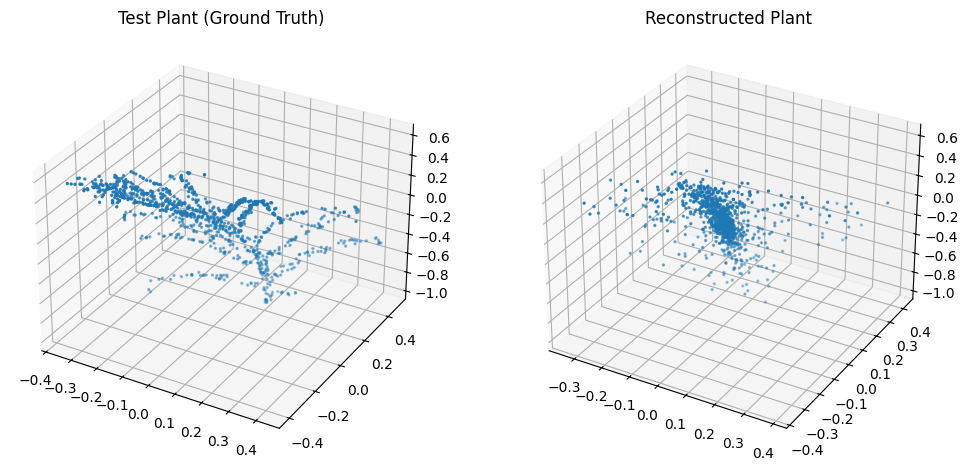

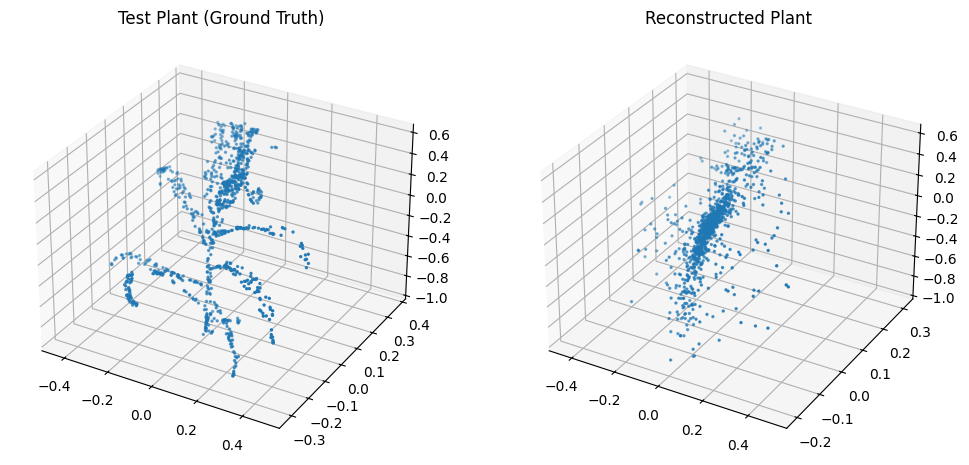

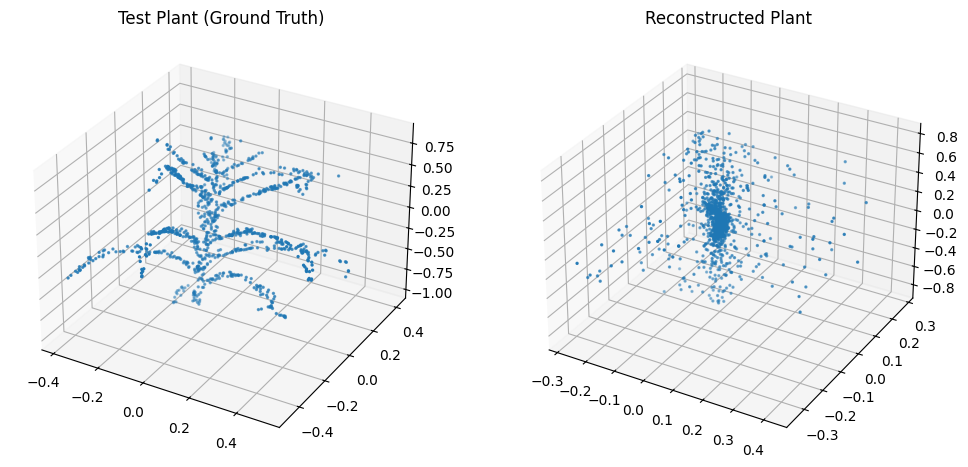

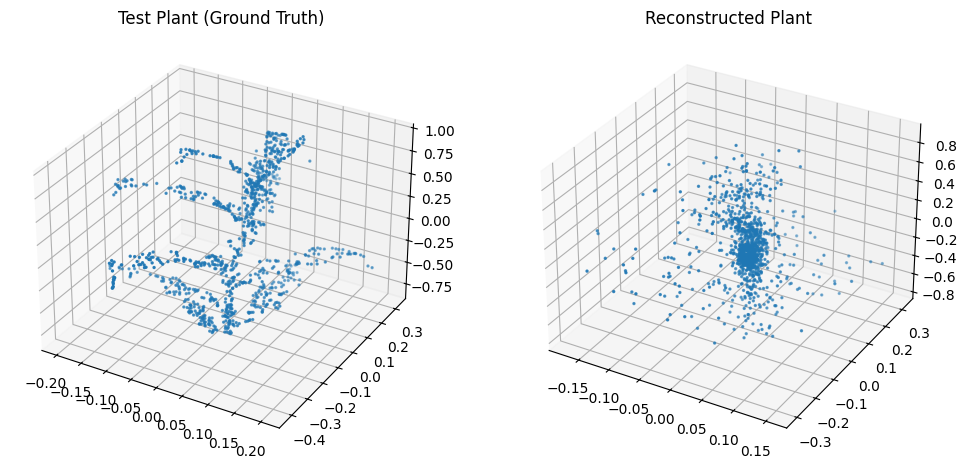

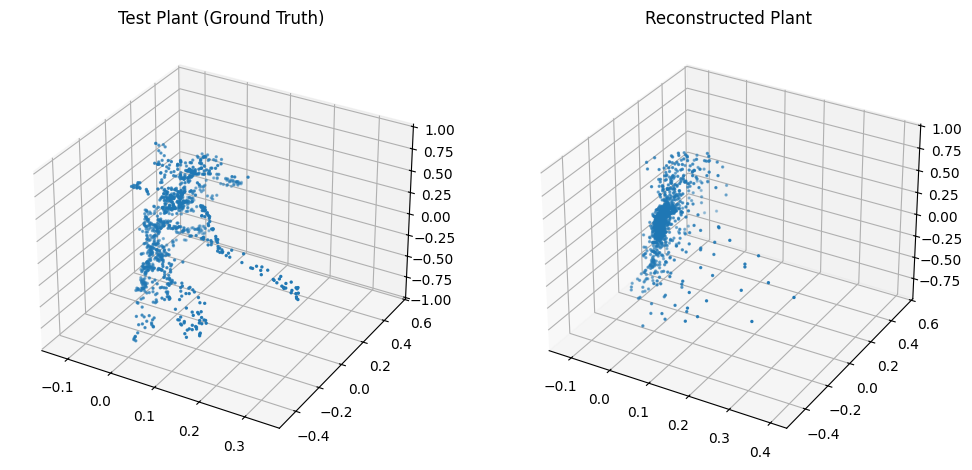

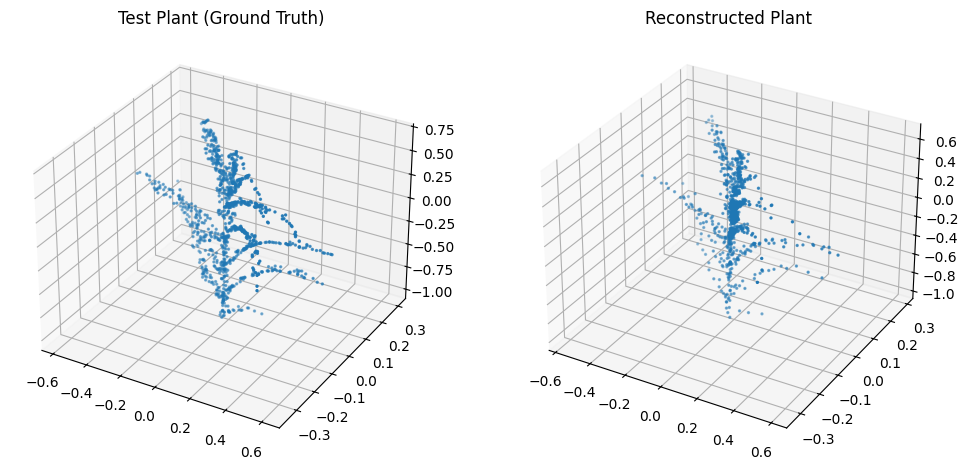

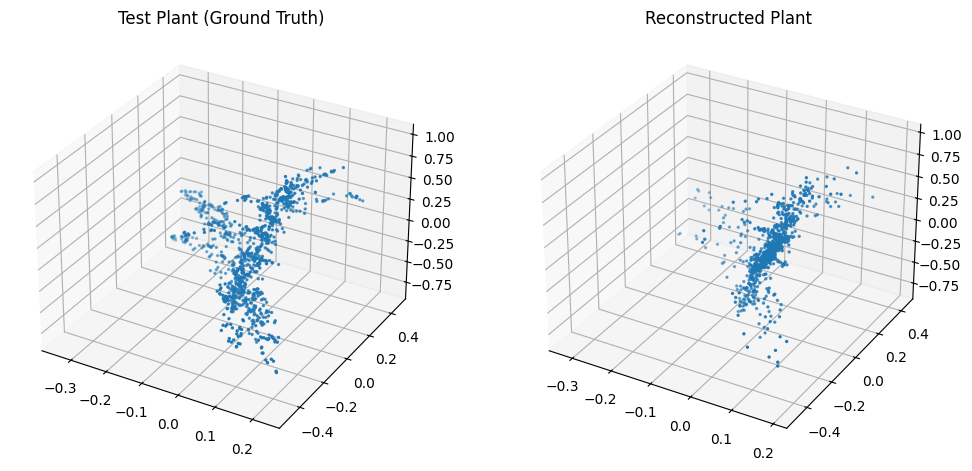

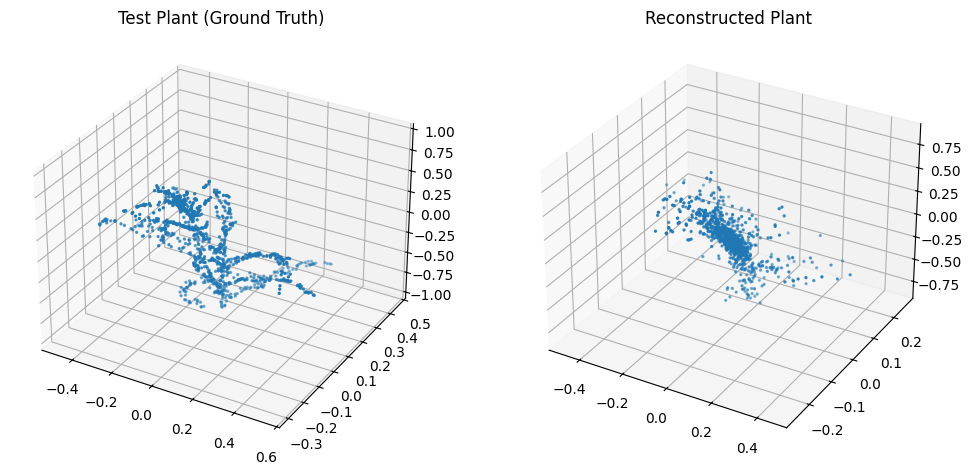

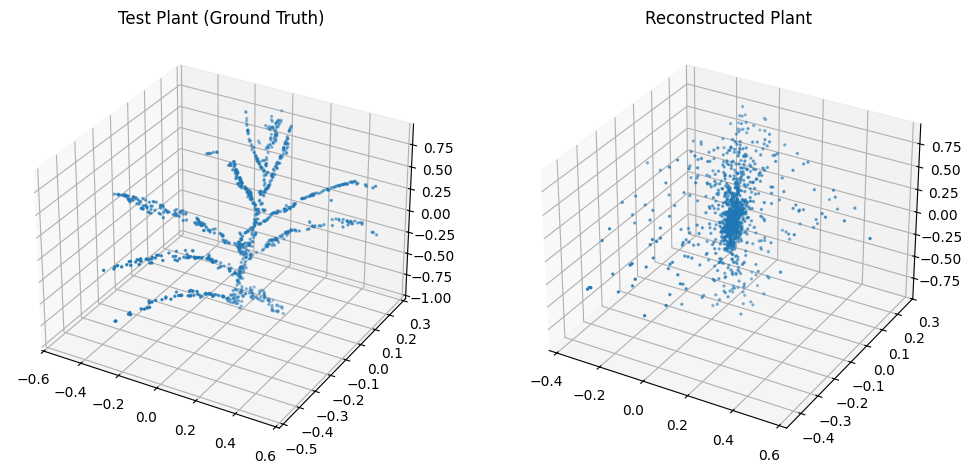

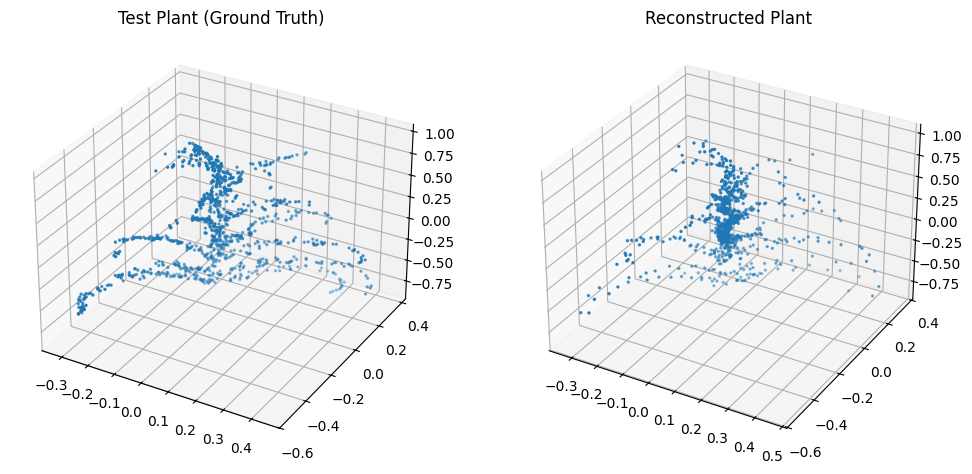

In [ ]:
visualize_test_reconstruction(model, test_dataset, num_samples=10)

In [ ]:
import open3d as o3d


def save_test_reconstructions(model, dataset, save_dir="test_recon"):

    os.makedirs(save_dir, exist_ok=True)

    model.eval()

    for i in range(20):

        pc = dataset[i].unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            recon = model(pc)

        recon = recon.squeeze().cpu().numpy()

        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(recon)

        o3d.io.write_point_cloud(f"{save_dir}/recon_{i}.ply", pcd)

In [ ]:
save_test_reconstructions(model, test_dataset)